In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D  # noqa
from matplotlib.colors import hsv_to_rgb
from itertools import chain
from yaniv_region_growing import regionGrow

In [2]:
# from utils.plots import get_pixel_colors,plotRGB,plotHSV
# from utils.smoothing import mean_smooth_rgb
# from utils.segmenting import segment_kmeans,pick_color_segment
# from utils.hough import r_theta_to_points,find_parallel_lines,draw_hough_lines,hough_line,show_hough_line
# from utils.fourier import fourier_trans,plot_fourier,build_circle_mask,build_rectangle_low_pass,build_rectangle_mask,mask_fourier

# General Functions

In [3]:
def get_pixel_colors(img_rgb):
    pixel_colors = img_rgb.reshape((np.shape(img_rgb)[0] * np.shape(img_rgb)[1], 3))
    norm = colors.Normalize(vmin=-1.0, vmax=1.0)
    norm.autoscale(pixel_colors)
    return norm(pixel_colors).tolist()
    

def plotRGB(img,pixel_colors):
    r, g, b = cv2.split(img)

    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    

    axis.scatter(
        r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker="."
    )
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    plt.show()

def plotHSV(img,pixel_colors):
    
    h, s, v = cv2.split(img)

    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    #pixel_colors = pic.reshape((np.shape(pic)[0] * np.shape(pic)[1], 3))
    axis.scatter(
        h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker="."
    )
    axis.set_xlabel("Hue")
    axis.set_ylabel("Saturation")
    axis.set_zlabel("Value")
    plt.show()
    
def plot_images(imgs,titles,n_rows,n_cols,figsize=(20,20)):
    fig,axes = plt.subplots(n_rows,n_cols,figsize=figsize)
    
    for ax,image,title in zip(axes.flatten(),imgs,titles):
        ax.imshow(image)
        ax.set_title(title)

In [4]:
def mean_smooth_rgb(img,kernel_size):
    def mean_smooth_channel(channel,kernel_size):
        mean_kernel = np.ones(kernel_size,np.float32)/(kernel_size[0]*kernel_size[1])
        return cv2.filter2D(channel,-1,mean_kernel)
    r,g,b = cv2.split(img)
    
    r = mean_smooth_channel(r,kernel_size)
    g = mean_smooth_channel(g,kernel_size)
    b = mean_smooth_channel(b,kernel_size)
    
    return cv2.merge((r,g,b))

In [5]:
def segment_kmeans(img, n_clusters,random_state=0):
    img_normalized = img/255.0
    img_n = img_normalized.reshape(img_normalized.shape[0]*img_normalized.shape[1], img_normalized.shape[2]) # transform to 2d array
    kmeans = KMeans(n_clusters=n_clusters,random_state=random_state).fit(img_n)
    colors_pool = np.array([
        [255,77,0],
        [30,144,255],
        [173,255,47],        
        [255,0,0],
        [0,0,0],
        [255,255,255],
        [255,4,0]
        
    ])
    len_ = colors_pool.shape[0]
    segments_colors = np.array([colors_pool[i%len_] for i in range(len(kmeans.cluster_centers_))])
    img_segmented = segments_colors[kmeans.labels_]
    return img_segmented.reshape(img.shape[0],img.shape[1],img.shape[2])


def pick_color_segment(img_hsv,img_rgb,color="orange"):
    #img_rpf_000102_kmeans_hsv = cv2.cvtColor((kmeans_img*255).astype(np.uint8),cv2.COLOR_RGB2HSV)
    light_orange = (1, 190, 200)
    dark_orange = (18, 255, 255)
    orange_mask = cv2.inRange(img_hsv,light_orange,dark_orange)
    #segment_orange_img = cv2.bitwise_and((kmeans_img*255).astype(np.uint8),(kmeans_img*255).astype(np.uint8),mask=orange_mask)
    segment_orange_img = cv2.bitwise_and(img_rgb,img_rgb,mask=orange_mask)
    return orange_mask,segment_orange_img
    #plot_images([orange_mask,segment_orange_img],["orange_mask","segment_orange_img"],1,2)

In [6]:
def r_theta_to_points(r,theta,point_distance=1000):
    a,b = np.cos(theta), np.sin(theta)
    x0,y0 = a*r, b*r
    x1,y1 = int(x0 + point_distance * (-b)), int(y0 + point_distance*a)
    x2,y2 = int(x0 - point_distance * (-b)), int(y0 - point_distance*a)
    return [(x1,y1),(x2,y2)]

def find_parallel_lines(out_lines,max_theta_thresh = 0.06,min_r_thresh = 100):
    parrallel_lines = [] # will contain indexes from out_lines
    for line_i in range(len(out_lines)):
        for line_j in range(len(out_lines)):
            if line_i == line_j:
                continue
                
            # check for duplicates
            if (line_j,line_i) in parrallel_lines or (line_i,line_j) in parrallel_lines:
                continue
            r_diff = abs(out_lines[line_i][0]-out_lines[line_j][0])
            theta_diff = abs(out_lines[line_i][1]-out_lines[line_j][1])
            if  r_diff > min_r_thresh and theta_diff < max_theta_thresh:
                parrallel_lines.append((line_i,line_j))
    return parrallel_lines

def draw_hough_lines(img,edge_map,
                     theta_res,rho_res=1,min_votes=150,point_distance=1000,
                    lines_color = (255,0,0)):
    '''
        theta_res = np.pi/180
    '''
    
    lines_map = cv2.HoughLines(edge_map,rho_res,theta_res,min_votes,0,0)
    
    #print(lines_map)
    
    
    outlines  = []
    #for r,theta in lines_map:
    for line in lines_map:
        r,theta = line[0]
        a,b = np.cos(theta), np.sin(theta)
        x0,y0 = a*r, b*r
        x1,y1 = int(x0 + point_distance * (-b)), int(y0 + point_distance*a)
        x2,y2 = int(x0 - point_distance * (-b)), int(y0 - point_distance*a)
        outlines.append([r,theta])
        cv2.line(img,(x1,y1),(x2,y2),lines_color,2)
    return img,outlines


import imageio
import math

def hough_line(img, angle_step=1, lines_are_white=True, value_threshold=5):
    """
    Hough transform for lines
    Input:
    img - 2D binary image with nonzeros representing edges
    angle_step - Spacing between angles to use every n-th angle
                 between -90 and 90 degrees. Default step is 1.
    lines_are_white - boolean indicating whether lines to be detected are white
    value_threshold - Pixel values above or below the value_threshold are edges
    Returns:
    accumulator - 2D array of the hough transform accumulator
    theta - array of angles used in computation, in radians.
    rhos - array of rho values. Max size is 2 times the diagonal
           distance of the input image.
    """
    # Rho and Theta ranges
    thetas = np.deg2rad(np.arange(-90.0, 90.0, angle_step))
    width, height = img.shape
    diag_len = int(round(math.sqrt(width * width + height * height)))
    rhos = np.linspace(-diag_len, diag_len, diag_len * 2)

    # Cache some resuable values
    cos_t = np.cos(thetas)
    sin_t = np.sin(thetas)
    num_thetas = len(thetas)

    # Hough accumulator array of theta vs rho
    accumulator = np.zeros((2 * diag_len, num_thetas), dtype=np.uint8)
    # (row, col) indexes to edges
    are_edges = img > value_threshold if lines_are_white else img < value_threshold
    y_idxs, x_idxs = np.nonzero(are_edges)

    # Vote in the hough accumulator
    for i in range(len(x_idxs)):
        x = x_idxs[i]
        y = y_idxs[i]

        for t_idx in range(num_thetas):
            # Calculate rho. diag_len is added for a positive index
            rho = diag_len + int(round(x * cos_t[t_idx] + y * sin_t[t_idx]))
            accumulator[rho, t_idx] += 1

    return accumulator, thetas, rhos


def show_hough_line(img, accumulator, thetas, rhos, save_path=None):
    plt.imshow(accumulator, aspect='auto',cmap='jet', extent=[np.rad2deg(thetas[-1]), np.rad2deg(thetas[0]), rhos[-1], rhos[0]])
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

In [7]:
def fourier_trans(img_,mask):
    img_fft = np.fft.fft2(img_)
    fshift = np.fft.fftshift(img_fft)
    amplitude = 20 * np.log(np.abs(fshift) + 1)
    fshift*=mask
    amplitude_filtered = 20 * np.log(np.abs(fshift) + 1) 
    return np.abs(np.fft.ifft2(np.fft.ifftshift(fshift))),amplitude,amplitude_filtered #np.abs

def plot_fourier(img,amplitude,mask,amplitude_filtered,img_filtered):
    fig, axes = plt.subplots(2,3, figsize=(20, 10))
    fig.delaxes(axes[1,2])
    for img, ax, title in zip([img, amplitude, mask, amplitude_filtered, np.abs(img_filtered)],
                              chain.from_iterable(axes), 
                              ["img", "Amplitude Spectrum", "Filter", "Filtered Amplitude Spectrum", "img filtered"]):
        ax.imshow(img, cmap='gray')
        
def build_circle_mask(radius,channel):
    circle_mask = np.zeros_like(channel)
    rows,cols = channel.shape
    crow,ccol = rows//2,cols//2

    for i in range(crow-radius, crow+radius):
            for j in range(ccol-radius, ccol + radius):
                if (crow - i) ** 2 + (ccol - j) ** 2 <= radius**2:
                    circle_mask[i,j]=1
    return circle_mask

def build_rectangle_low_pass(height,width,channel):
    zeros = np.zeros_like(channel)
    rows,cols = channel.shape
    crow,ccol = rows//2,cols//2
    zeros[crow-height:crow+height,ccol-width:ccol+width] = 1
    return zeros

def build_rectangle_mask(height,width,channel,crow,ccol):
    ones = np.ones_like(channel)
    print(ccol)
    print(ccol+width)
    ones[crow-height//2:crow+height//2,ccol-width//2:ccol+width//2] = 0
    return ones


def mask_fourier(channels,masks):
    filtered_channels = []
    for channel,mask in zip(channels,masks):
        filtered_channel,amplitude,amplitude_filtered = fourier_trans(channel,mask)
        filtered_channels.append(filtered_channel)
        plot_fourier(channel,amplitude,mask,amplitude_filtered,filtered_channel)
    
    return np.dstack([filtered_channels[0].astype(int), 
                       filtered_channels[1].astype(int), 
                       filtered_channels[2].astype(int)])

# Experiment RPf_00102

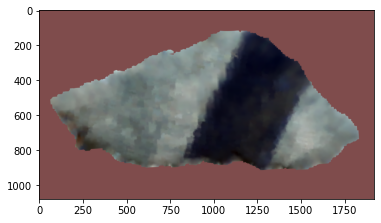

In [8]:
img_rpf_000102 = cv2.imread("images/raw/border/done/RPf_00102.png")
plt.imshow(img_rpf_000102)

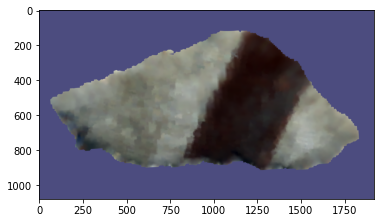

In [9]:
img_rpf_000102_rgb = cv2.cvtColor(img_rpf_000102,cv2.COLOR_BGR2RGB)
plt.imshow(img_rpf_000102_rgb)

In [9]:
smoothed_img = mean_smooth_rgb(img_rpf_000102_rgb,(150,150))
kmeans_img = segment_kmeans(smoothed_img,3)

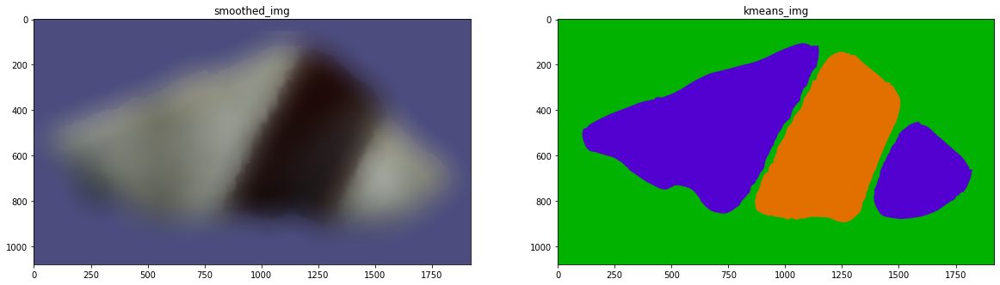

In [10]:
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["smoothed_img","kmeans_img"],1,2)

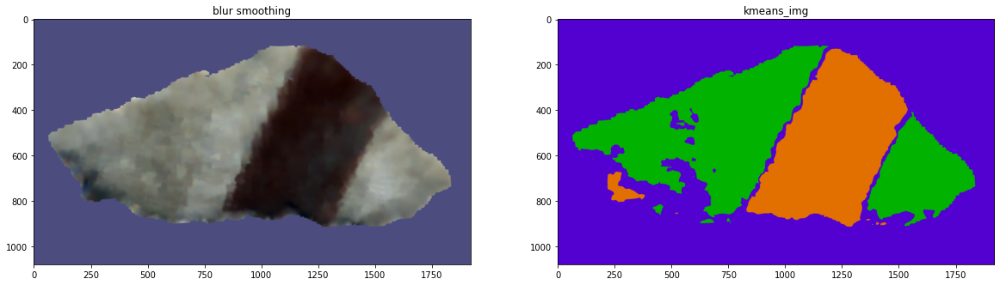

In [91]:
smoothed_img = cv2.bilateralFilter(img_rpf_000102_rgb,9,75,75)
kmeans_img = segment_kmeans(smoothed_img,3)
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["blur smoothing","kmeans_img"],1,2)

In [10]:
smoothed_img = cv2.bilateralFilter(img_rpf_000102_rgb,200,300,300) #cv2.bilateralFilter(mean_smooth_rgb(img_rpf_000102_rgb,(100,100)),9,75,75)
kmeans_img = segment_kmeans(smoothed_img,3)
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["Smoothed Image","Segmented by Kmeans"],1,2)

KeyboardInterrupt: 

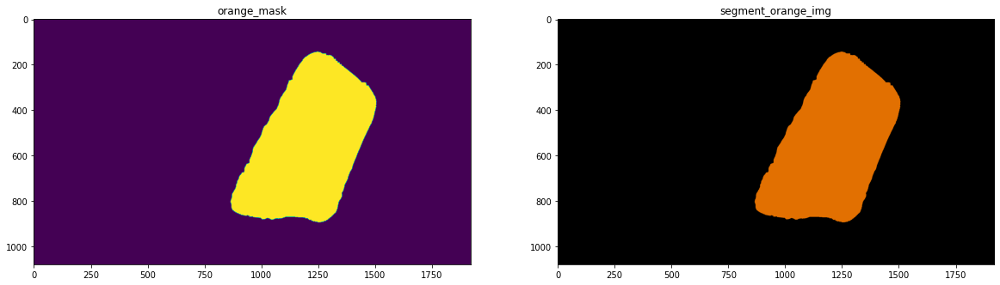

In [23]:
img_rpf_000102_kmeans_hsv = cv2.cvtColor((kmeans_img*255).astype(np.uint8),cv2.COLOR_RGB2HSV)
light_orange = (1, 190, 200)
dark_orange = (18, 255, 255)
orange_mask = cv2.inRange(img_rpf_000102_kmeans_hsv,light_orange,dark_orange)
segment_orange_img = cv2.bitwise_and((kmeans_img*255).astype(np.uint8),(kmeans_img*255).astype(np.uint8),mask=orange_mask)
plot_images([orange_mask,segment_orange_img],["orange_mask","segment_orange_img"],1,2)

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


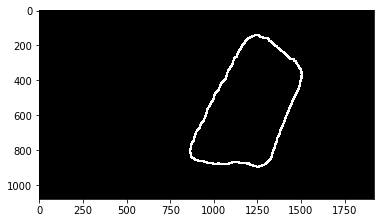

In [24]:
img_rpf_000102_segment_orange_img_gray = cv2.cvtColor((segment_orange_img*255).astype(np.uint8),cv2.COLOR_RGB2GRAY)
rpf_000102_gray_edge_map = cv2.Canny(img_rpf_000102_segment_orange_img_gray,250,350)
plt.imshow(1/(1+np.abs(rpf_000102_gray_edge_map)),cmap="gray")

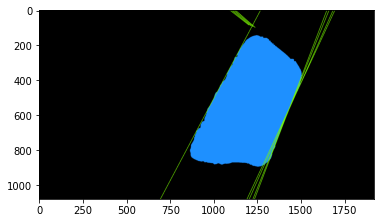

In [19]:
img_with_lines,out_lines = draw_hough_lines(
        (segment_orange_img*255).astype(np.uint8),
        rpf_000102_gray_edge_map, #1/(1+np.abs(rpf_000102_gray_edge_map))
        1*np.pi/180,min_votes=80,
        lines_color=(124,252,0))
plt.imshow(img_with_lines)

In [20]:
out_lines
#[r,theta]

[[1541.0, 0.38397244],
 [1540.0, 0.36651915],
 [1540.0, 0.41887903],
 [-716.0, 2.268928],
 [-694.0, 2.2514746],
 [1121.0, 0.4886922],
 [-737.0, 2.2863812],
 [1537.0, 0.43633232],
 [-673.0, 2.2340214]]

In [30]:
max_theta_thresh = 0.06
min_r_thresh = 100
parrallel_lines = find_parallel_lines(out_lines)

# for line_i in range(len(out_lines)):
#     for line_j in range(len(out_lines)):
#         if line_i == line_j:
#             continue
        
#         # check for duplicates
#         if (line_j,line_i) in parrallel_lines or (line_i,line_j) in parrallel_lines:
#             continue
#         r_diff = abs(out_lines[line_i][0]-out_lines[line_j][0])
#         theta_diff = abs(out_lines[line_i][1]-out_lines[line_j][1])
#         if  r_diff > min_r_thresh and theta_diff < max_theta_thresh:
#             parrallel_lines.append((line_i,line_j))
            
parrallel_lines

[(5, 7)]

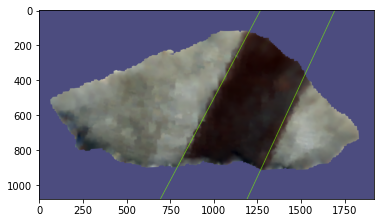

In [31]:
img_rpf_000102_rgb_with_lines = np.copy(img_rpf_000102_rgb)
lines_color=(124,252,0)
for parralel_pair in parrallel_lines:
    for ln_i in range(2):
        line_ = out_lines[parralel_pair[ln_i]]
        (x11,y11),(x12,y12) = r_theta_to_points(line_[0],line_[1])
        cv2.line(img_rpf_000102_rgb_with_lines,(x11,y11),(x12,y12),lines_color,2)
    #second_line = parralel_pair[1]
plt.imshow(img_rpf_000102_rgb_with_lines)

## New Imaging

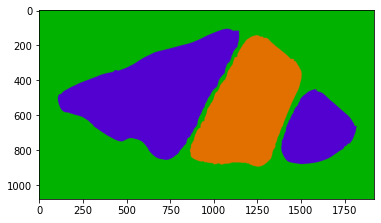

In [11]:
plt.imshow((kmeans_img*255).astype(np.uint8))

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


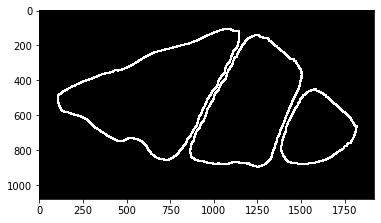

In [12]:
img_rpf_000102_segment_orange_img_gray = cv2.cvtColor((kmeans_img*255).astype(np.uint8),cv2.COLOR_RGB2GRAY)
rpf_000102_gray_edge_map = cv2.Canny(img_rpf_000102_segment_orange_img_gray,70,150)
plt.imshow(1/(1+np.abs(rpf_000102_gray_edge_map)),cmap="gray")

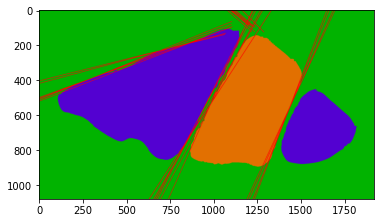

In [13]:
img_with_lines,out_lines = draw_hough_lines(
        (kmeans_img*255).astype(np.uint8),
        rpf_000102_gray_edge_map, #1/(1+np.abs(rpf_000102_gray_edge_map))
        1*np.pi/180,min_votes=80,
        lines_color=(255,0,0))
plt.imshow(img_with_lines)

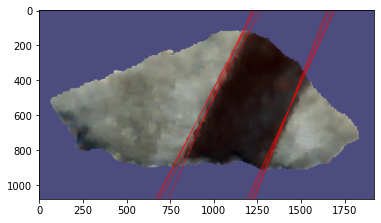

In [14]:
max_theta_thresh = 0.06
min_r_thresh = 100
parrallel_lines = find_parallel_lines(out_lines)

img_rpf_000102_rgb_with_lines = np.copy(img_rpf_000102_rgb)
lines_color=(255,0,0)
for parralel_pair in parrallel_lines:
    for ln_i in range(2):
        line_ = out_lines[parralel_pair[ln_i]]
        (x11,y11),(x12,y12) = r_theta_to_points(line_[0],line_[1])
        cv2.line(img_rpf_000102_rgb_with_lines,(x11,y11),(x12,y12),lines_color,2)
    #second_line = parralel_pair[1]
plt.imshow(img_rpf_000102_rgb_with_lines)

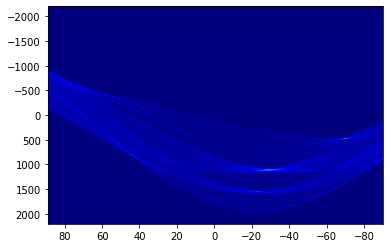

In [37]:
accumulator, thetas, rhos = hough_line(rpf_000102_gray_edge_map)
show_hough_line(None,
                accumulator,
                thetas, rhos,
                save_path=None)

# New Experiment

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.


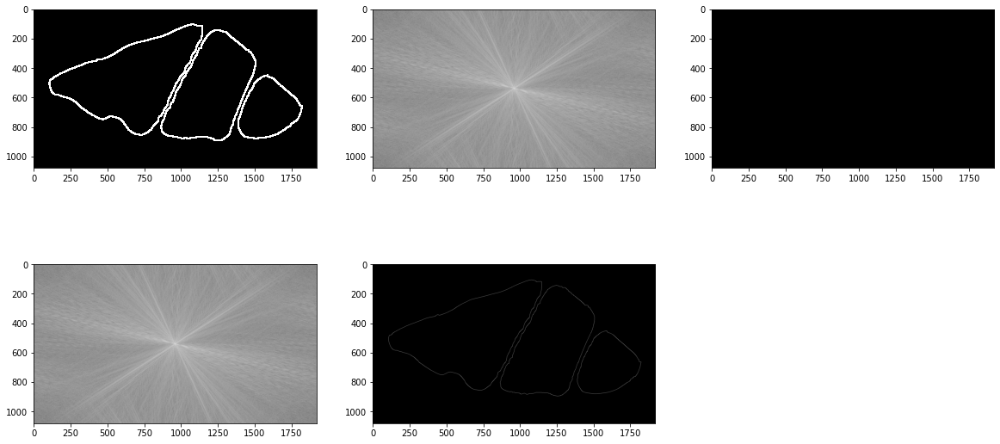

In [22]:
#img_f = mask_fourier([rpf_000102_gray_edge_map],[np.ones_like(rpf_000102_gray_edge_map)])
mask = np.ones_like(rpf_000102_gray_edge_map)
filtered_channel,amplitude,amplitude_filtered = fourier_trans(rpf_000102_gray_edge_map,mask)
plot_fourier(1/(1+np.abs(rpf_000102_gray_edge_map)),amplitude,mask,amplitude_filtered,filtered_channel)

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


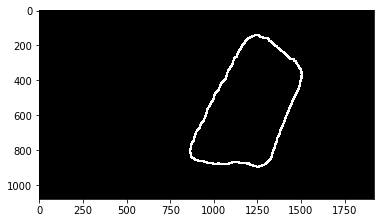

In [25]:
plt.imshow(1/(1+np.abs(rpf_000102_gray_edge_map)),cmap="gray")

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


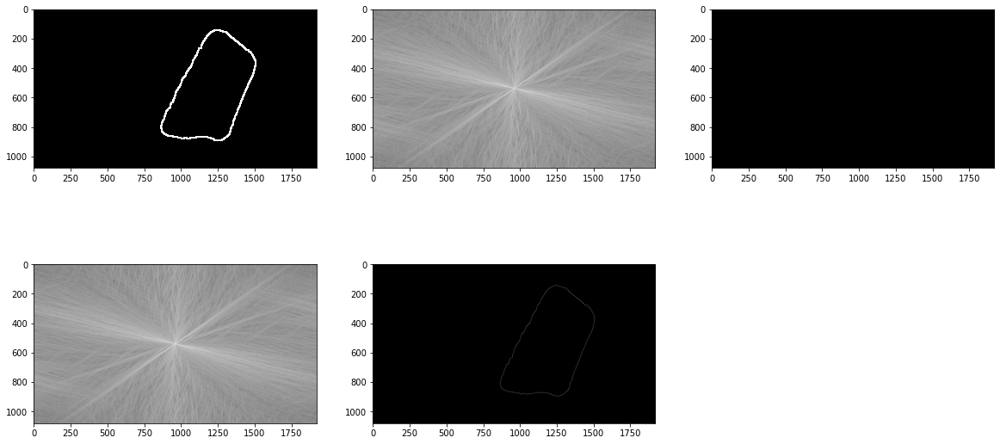

In [26]:
mask = np.ones_like(rpf_000102_gray_edge_map)
filtered_channel,amplitude,amplitude_filtered = fourier_trans(rpf_000102_gray_edge_map,mask)
plot_fourier(1/(1+np.abs(rpf_000102_gray_edge_map)),amplitude,mask,amplitude_filtered,filtered_channel)

# New Experiment

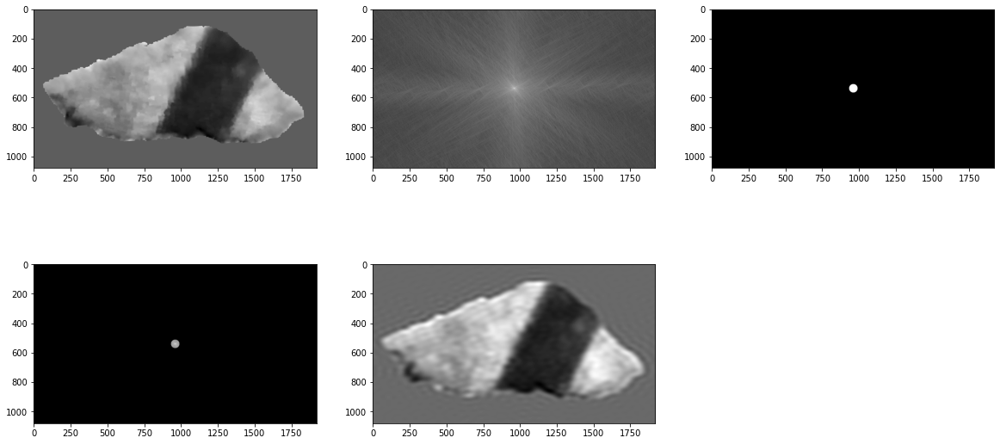

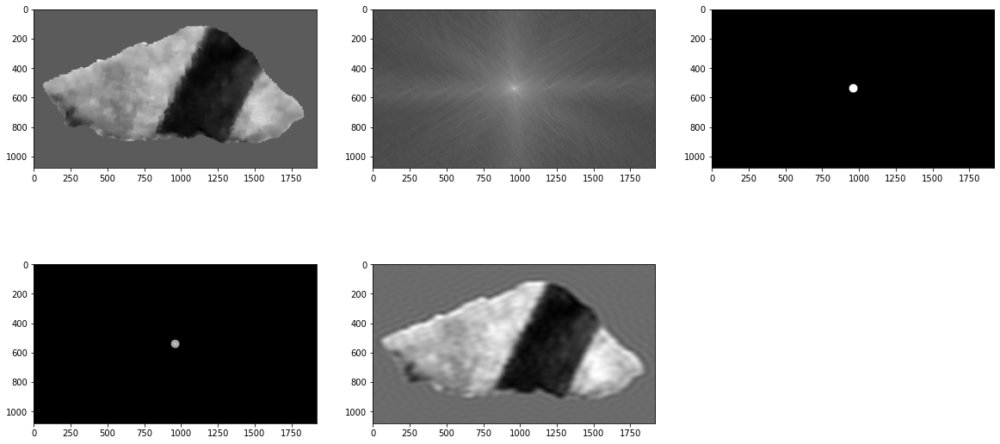

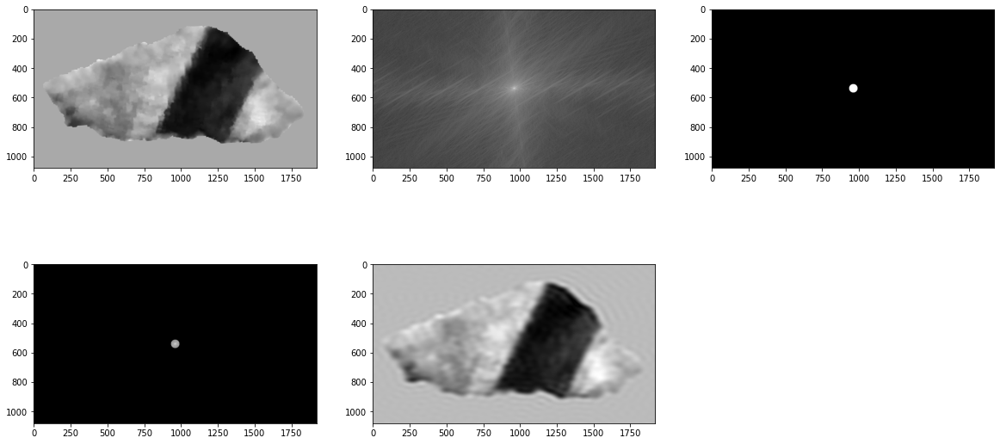

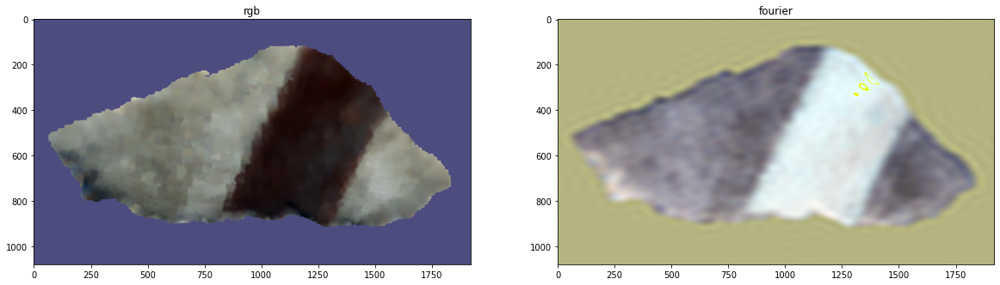

In [14]:
r,g,b = cv2.split(img_rpf_000102_rgb)
rows,cols = r.shape
crow,ccol = rows//2,cols//2

gauss_kernel = (51,51)

fourier_img = mask_fourier([r,g,b],
                           [
                               cv2.GaussianBlur(build_circle_mask(30,ch),gauss_kernel,0)
                            for ch in [r,g,b]])


plot_images([img_rpf_000102_rgb,(fourier_img*255).astype(np.uint8)],["rgb","fourier"],1,2)

In [ ]:
smoothed_img = cv2.bilateralFilter(img_rpf_000102_rgb,200,300,300) #cv2.bilateralFilter(mean_smooth_rgb(img_rpf_000102_rgb,(100,100)),9,75,75)
kmeans_img = segment_kmeans(smoothed_img,3)
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["Smoothed Image","Segmented by Kmeans"],1,2)

In [ ]:
img_rpf_000102_segment_orange_img_gray = cv2.cvtColor((segment_orange_img*255).astype(np.uint8),cv2.COLOR_RGB2GRAY)
rpf_000102_gray_edge_map = cv2.Canny(img_rpf_000102_segment_orange_img_gray,250,350)
plt.imshow(1/(1+np.abs(rpf_000102_gray_edge_map)),cmap="gray")

# Experiment RPf_00152_obj

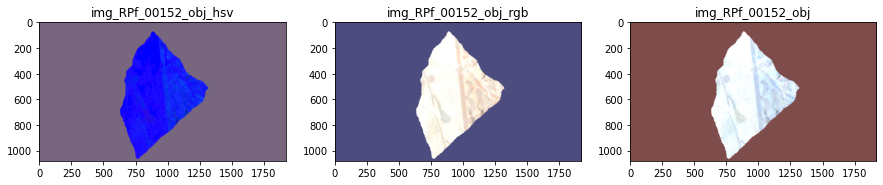

In [37]:
img_RPf_00152_obj = cv2.imread("RPf_00152_obj.png")
img_RPf_00152_obj_rgb = cv2.cvtColor(img_RPf_00152_obj,cv2.COLOR_BGR2RGB)
img_RPf_00152_obj_hsv = cv2.cvtColor(img_RPf_00152_obj,cv2.COLOR_BGR2HSV)
plot_images([img_RPf_00152_obj_hsv,img_RPf_00152_obj_rgb,img_RPf_00152_obj],
            ["img_RPf_00152_obj_hsv","img_RPf_00152_obj_rgb","img_RPf_00152_obj"],
            1,3,figsize=(15,15))

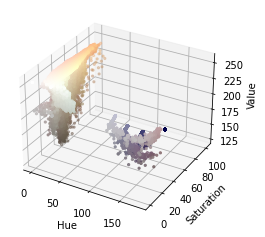

In [38]:
plotHSV(img_RPf_00152_obj_hsv,get_pixel_colors(img_RPf_00152_obj_rgb))

In [39]:
smoothed_img = mean_smooth_rgb(img_RPf_00152_obj,(45,45))
kmeans_img = segment_kmeans(smoothed_img,6)

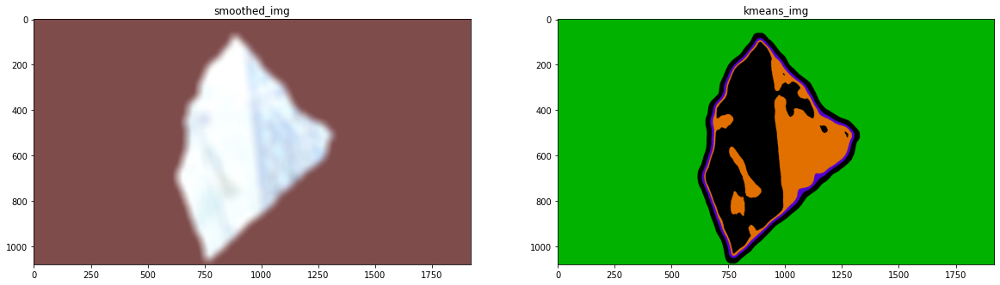

In [40]:
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["smoothed_img","kmeans_img"],1,2)

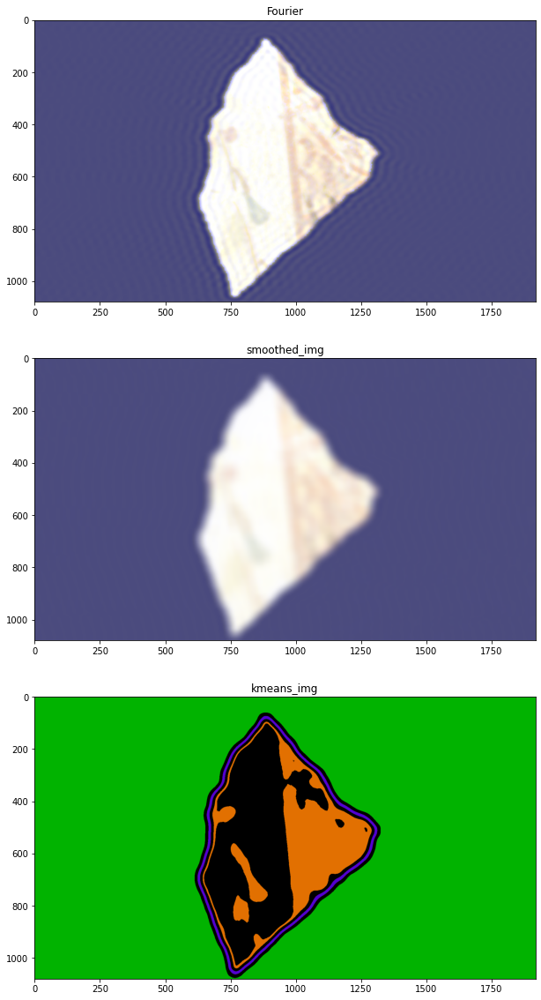

In [45]:
img_RPf_00152_obj_2 =cv2.imread("RPf_00152_obj_2.png")
smoothed_img = mean_smooth_rgb(img_RPf_00152_obj_2,(45,45))
kmeans_img = segment_kmeans(smoothed_img,6)
plot_images([img_RPf_00152_obj_2,smoothed_img,(kmeans_img*255).astype(np.uint8)],["Fourier","smoothed_img","kmeans_img"],3,1)

# Experiment RPf_00262_obj

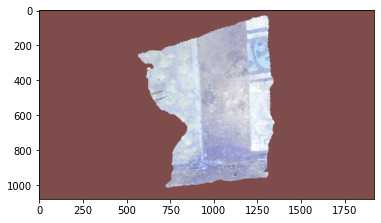

In [38]:
img_RPf_00262_obj = cv2.imread("RPf_00262_obj.png")
plt.imshow(img_RPf_00262_obj)

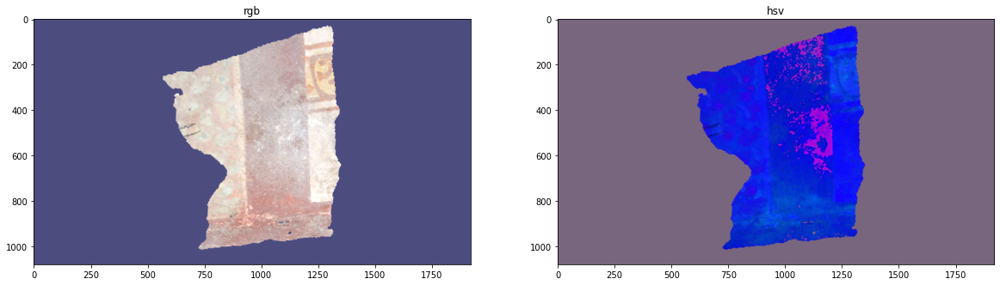

In [198]:
img_RPf_00262_obj_rgb = cv2.cvtColor(img_RPf_00262_obj,cv2.COLOR_BGR2RGB)
img_RPf_00262_obj_hsv = cv2.cvtColor(img_RPf_00262_obj,cv2.COLOR_BGR2HSV)
plot_images([img_RPf_00262_obj_rgb,img_RPf_00262_obj_hsv],["rgb","hsv"],1,2)

In [40]:
smoothed_img = cv2.bilateralFilter(img_RPf_00262_obj_rgb,200,300,300) #cv2.bilateralFilter(mean_smooth_rgb(img_rpf_000102_rgb,(100,100)),9,75,75)
kmeans_img = segment_kmeans(smoothed_img,20)

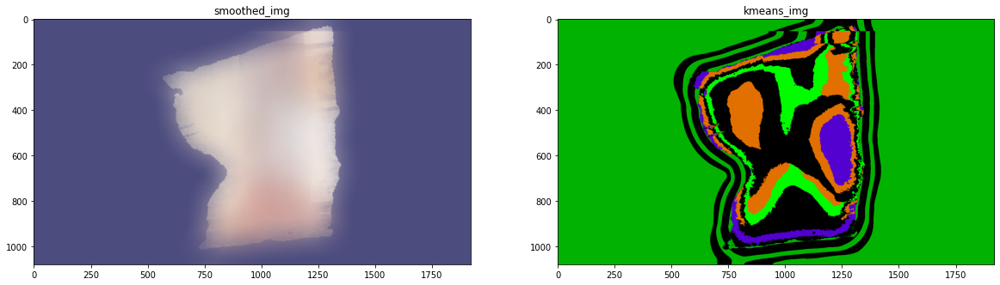

In [41]:
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["smoothed_img","kmeans_img"],1,2)

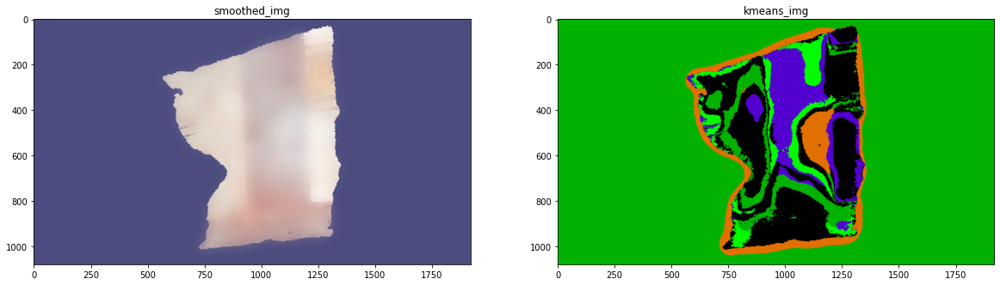

In [43]:
smoothed_img = cv2.bilateralFilter(img_RPf_00262_obj_rgb,100,150,150) #cv2.bilateralFilter(mean_smooth_rgb(img_rpf_000102_rgb,(100,100)),9,75,75)
kmeans_img = segment_kmeans(smoothed_img,20)
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["smoothed_img","kmeans_img"],1,2)

In [47]:
img_RPf_00262_obj_gray = cv2.cvtColor(img_RPf_00262_obj,cv2.COLOR_BGR2GRAY)
r,g,b = cv2.split(img_RPf_00262_obj_rgb)

960
968
960
968
960
968


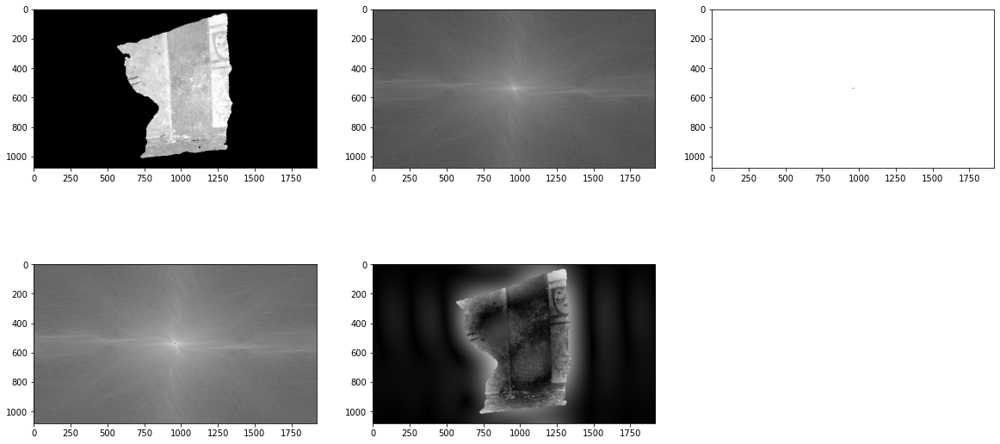

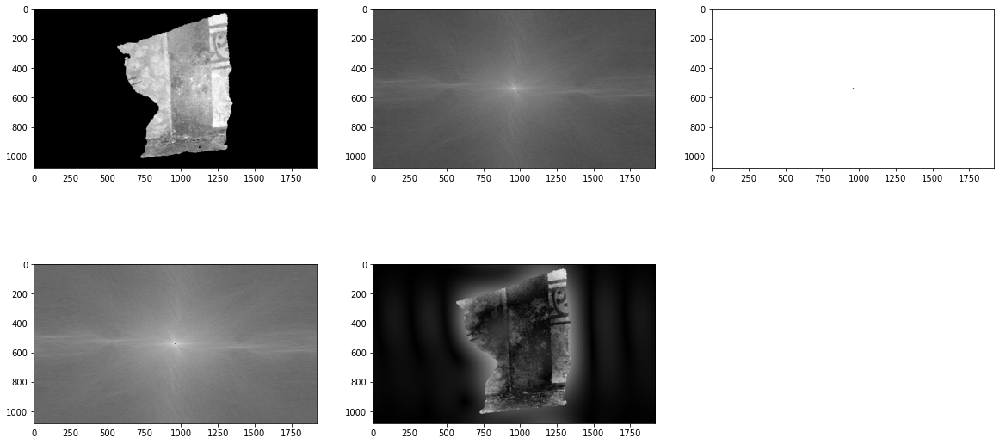

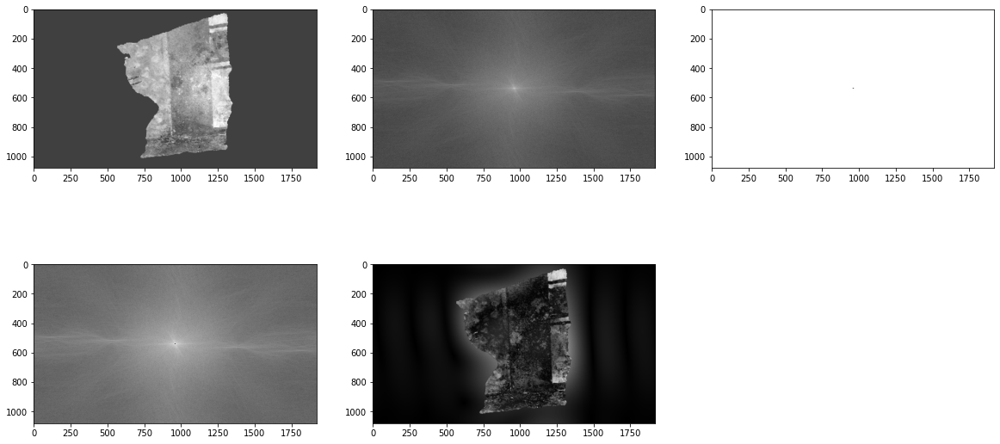

In [278]:
rows,cols = r.shape
crow,ccol = rows//2,cols//2
fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(2*2,4*2,ch,crow,ccol) for ch in [r,g,b]])

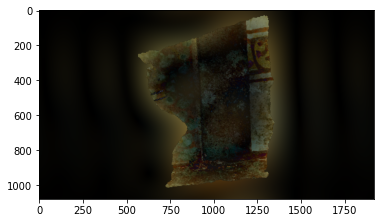

In [279]:
plt.imshow(fourier_img)

960
2660
960
2660
960
2660


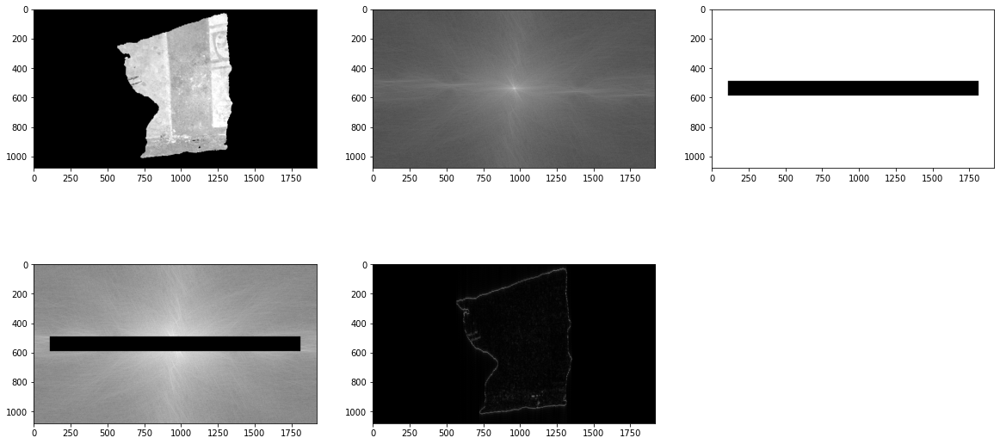

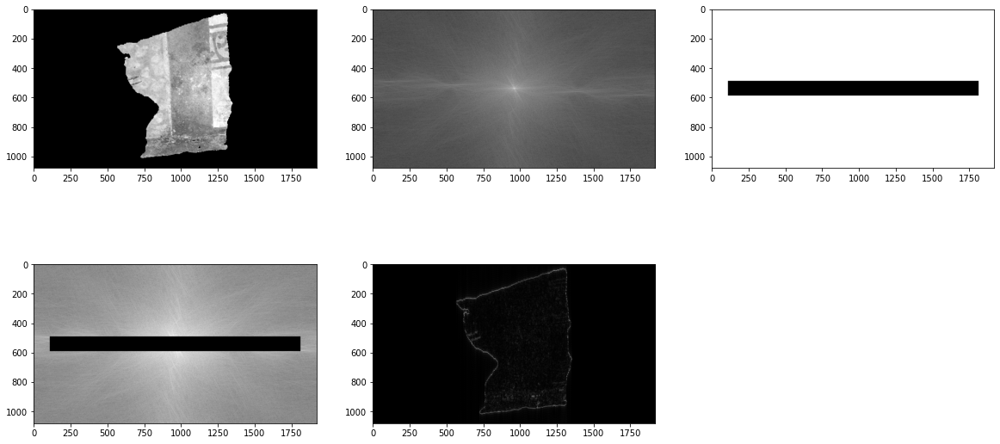

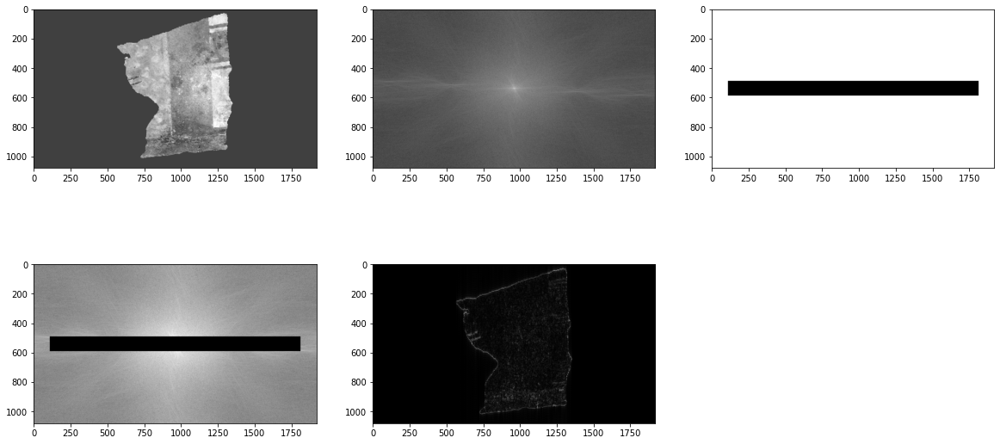

In [146]:
rows,cols = r.shape
crow,ccol = rows//2,cols//2
fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(50*2,850*2,ch,crow,ccol) for ch in [r,g,b]])

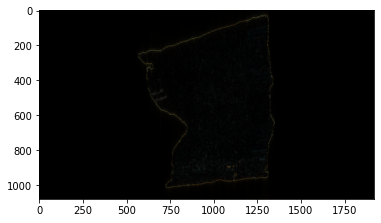

In [147]:
plt.imshow(fourier_img)

960
980
960
980
960
980


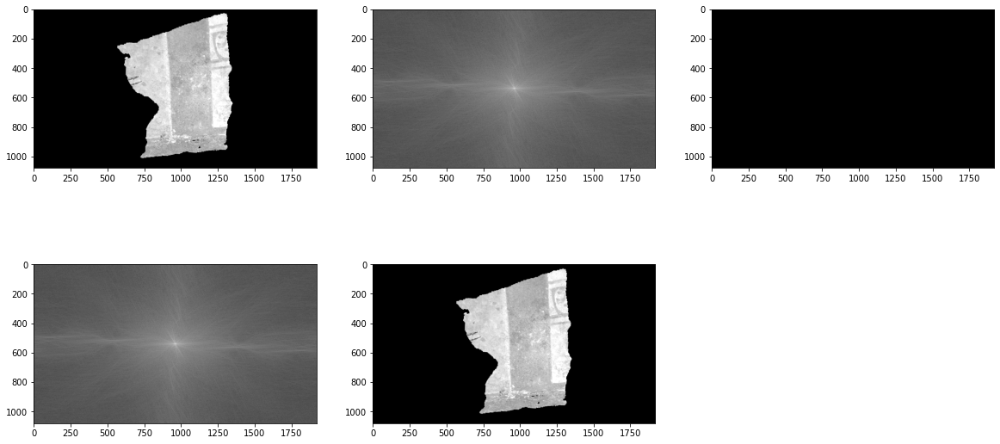

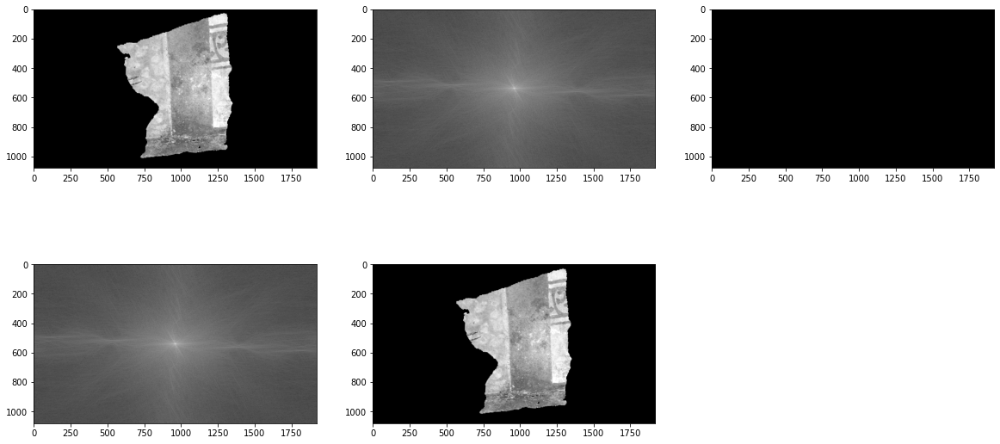

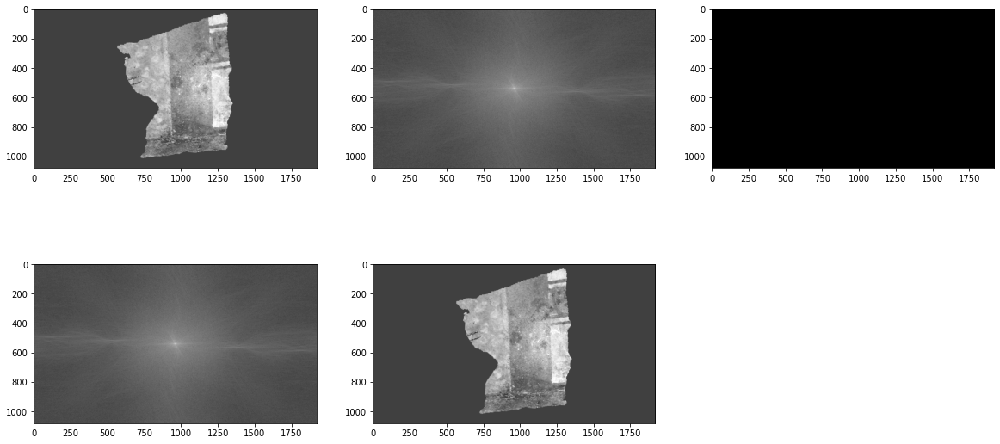

In [163]:
rows,cols = r.shape
crow,ccol = rows//2,cols//2
fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(1,10*2,ch,crow,ccol) for ch in [r,g,b]])


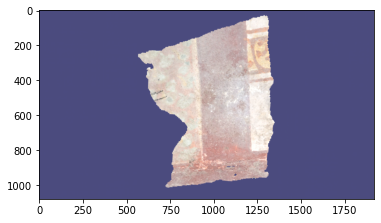

In [164]:
plt.imshow(fourier_img)

960
1360
960
1360
960
1360


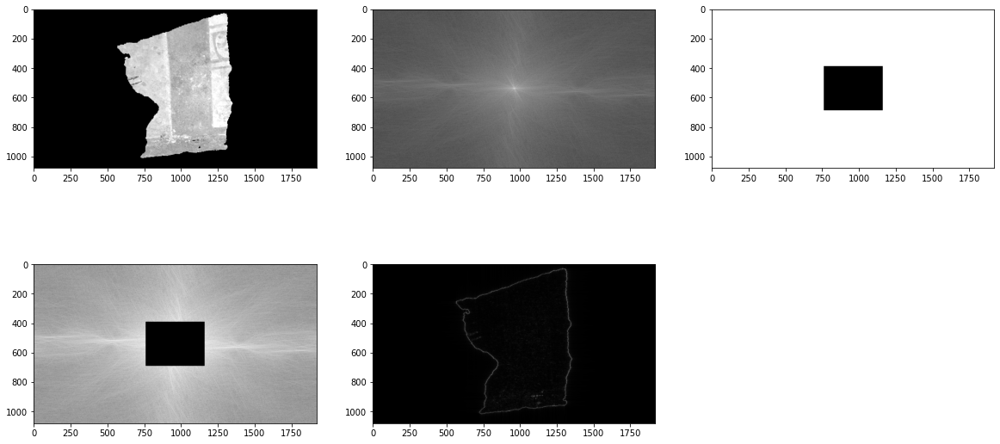

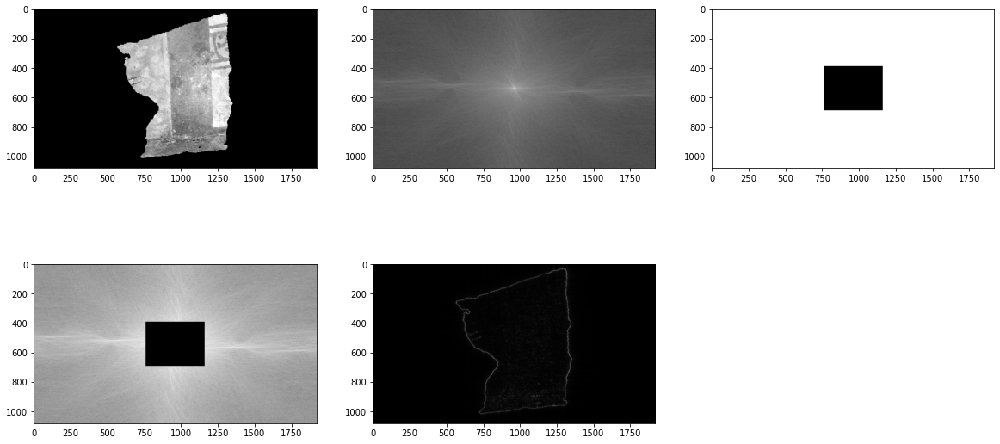

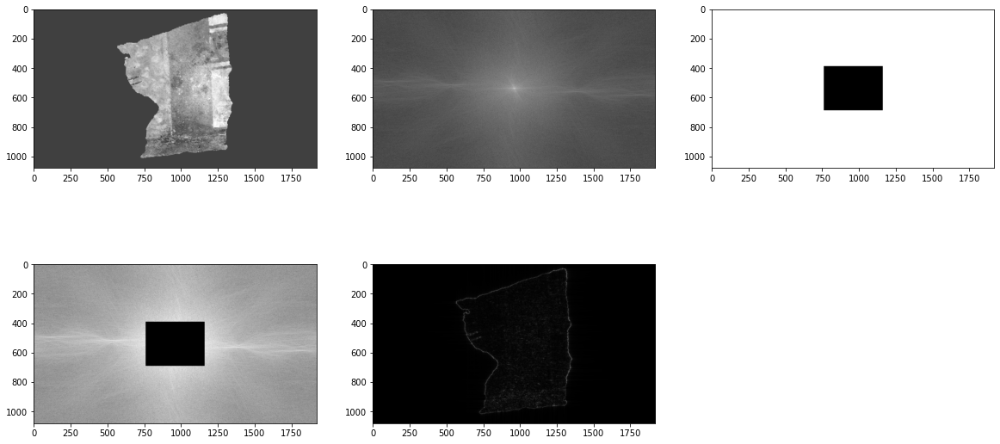

In [187]:
rows,cols = r.shape
crow,ccol = rows//2,cols//2
fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(150*2,200*2,ch,crow,ccol) for ch in [r,g,b]])

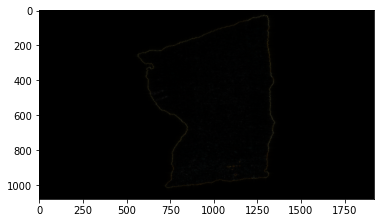

In [188]:
plt.imshow(fourier_img)

In [80]:
rows,cols = r.shape
crow,ccol = rows//2,cols//2
print(crow,ccol)

540 960


300
960
1060
960
1060
960
1060
960
1060
960
1060
960
1060


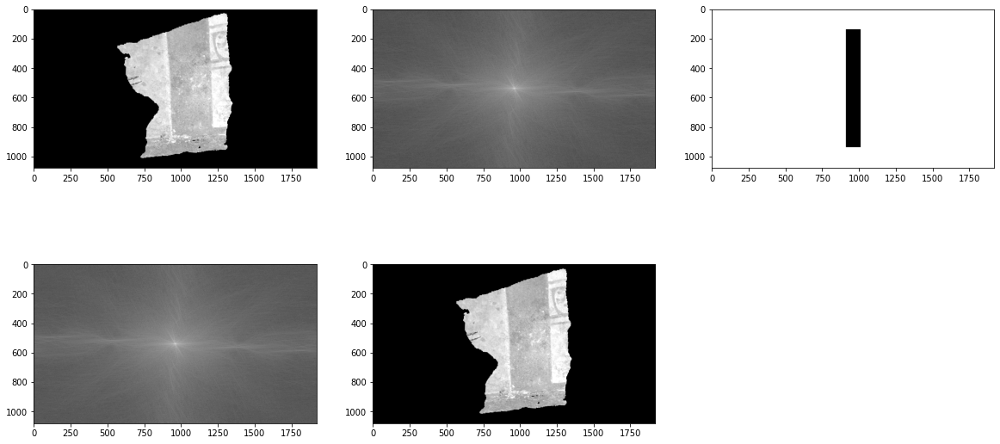

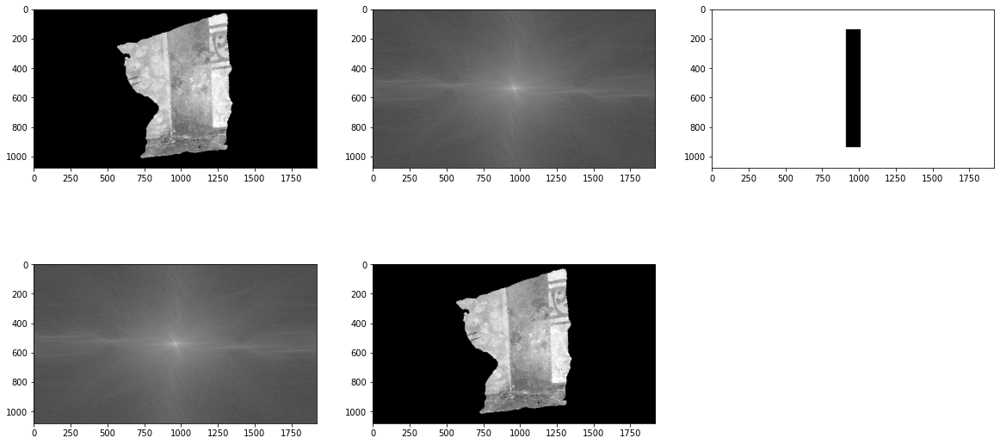

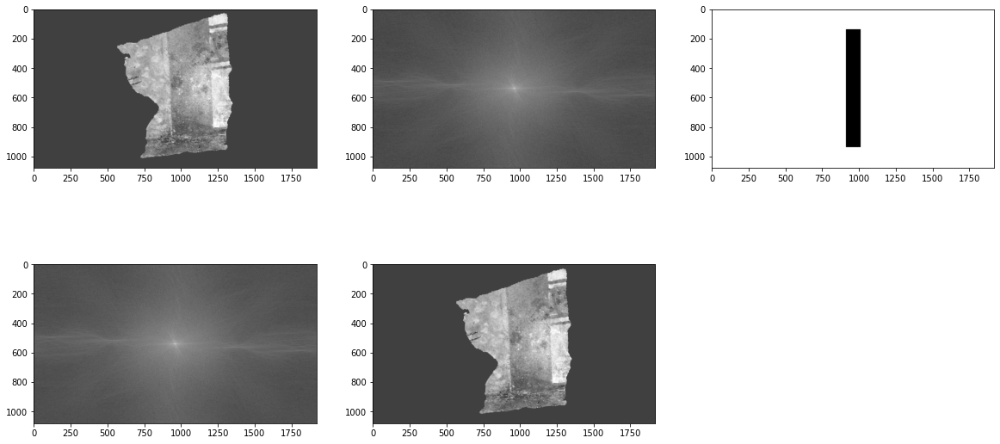

In [181]:
shift_col = 0
shift_row = 200
height_ = 400
width_ = 100
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

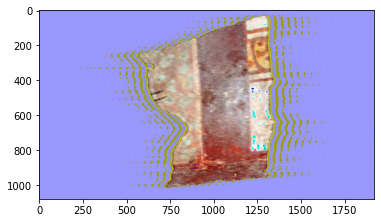

In [182]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
1110
1410
810
1110
1110
1410
810
1110
1110
1410
810
1110


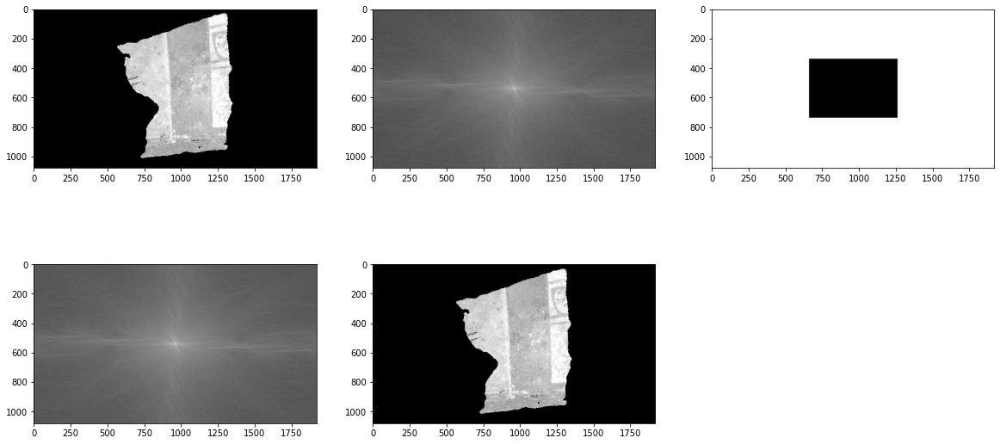

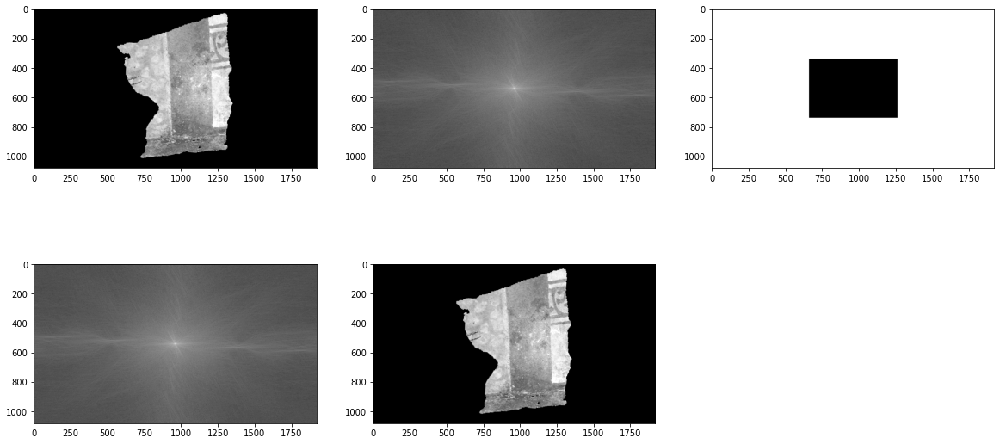

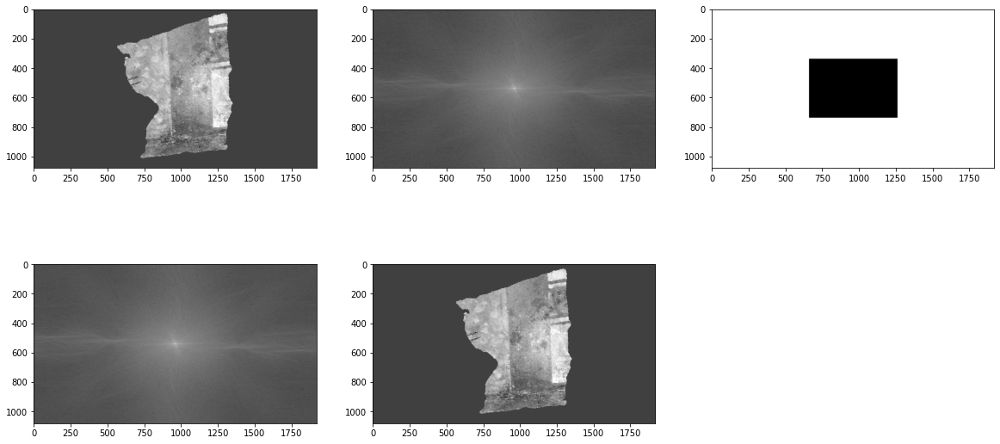

In [195]:
shift_col = 150
shift_row = 0
height_ = 400
width_ = 300
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

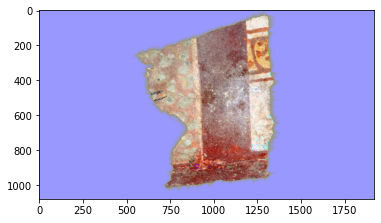

In [196]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
1160
1560
760
1160
1160
1560
760
1160
1160
1560
760
1160


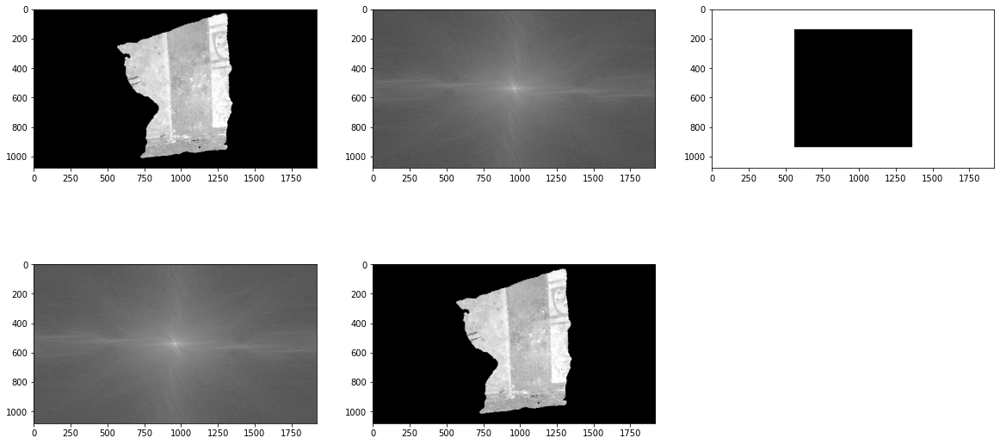

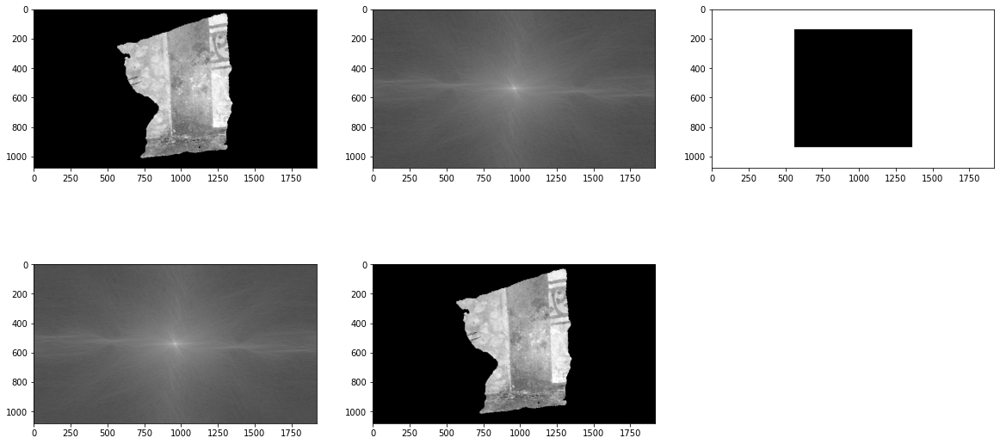

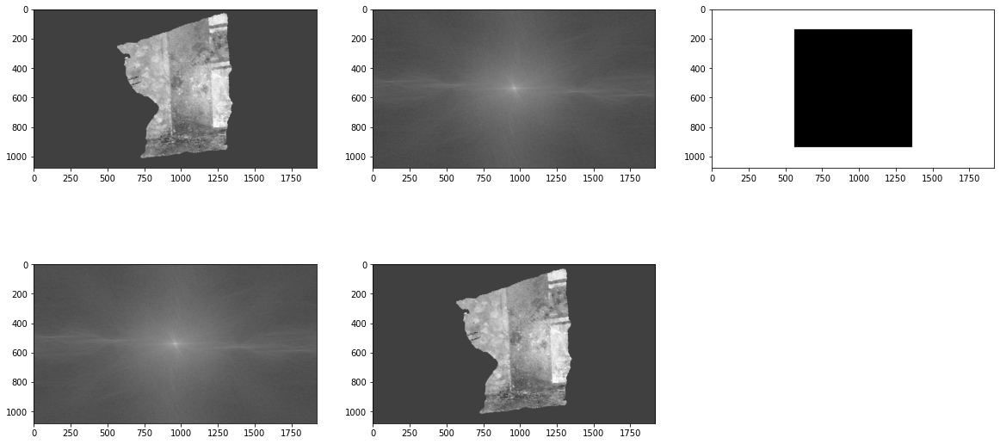

In [249]:
shift_col = 200
shift_row = 0
height_ = 800 # 300
width_ = 400 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

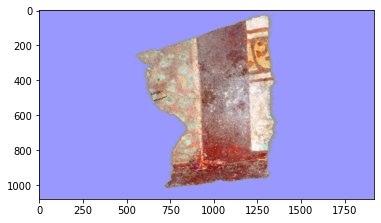

In [250]:
plt.imshow((fourier_img*255).astype(np.uint8))

960
962
960
962
960
962


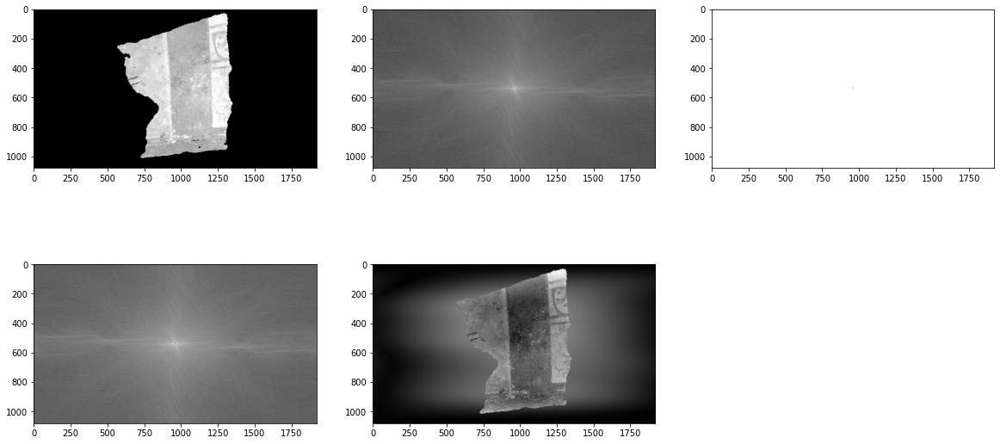

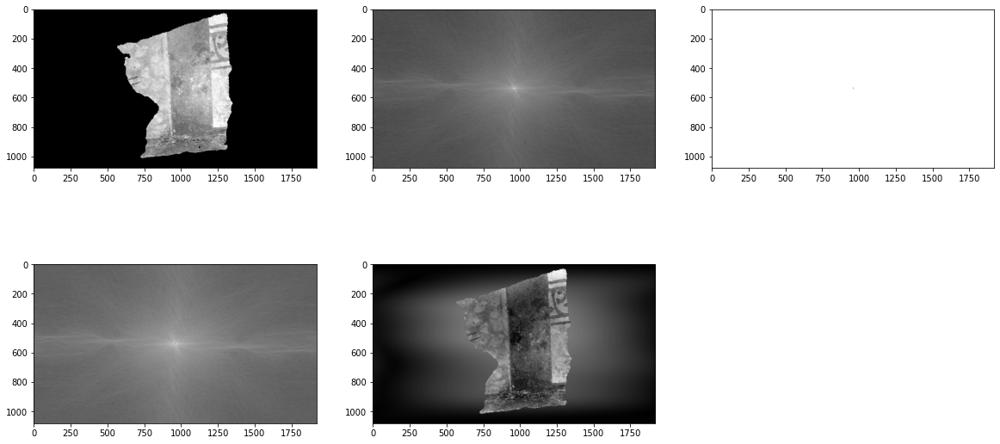

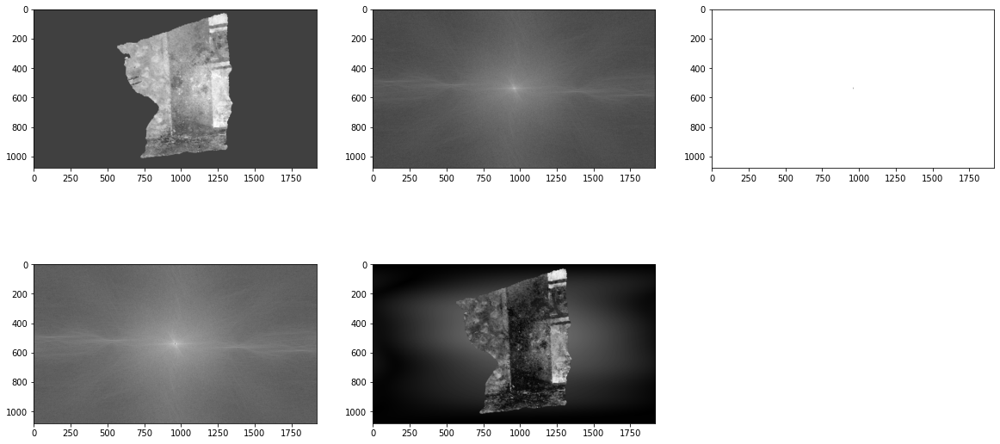

In [396]:
rows,cols = r.shape
crow,ccol = rows//2,cols//2
#fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(2*2,4*2,ch,crow,ccol) for ch in [r,g,b]])
fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(5*2,2,ch,crow,ccol) for ch in [r,g,b]])

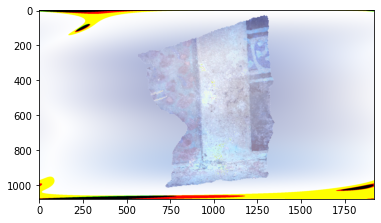

In [397]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
962
970
958
966
962
970
958
966
962
970
958
966


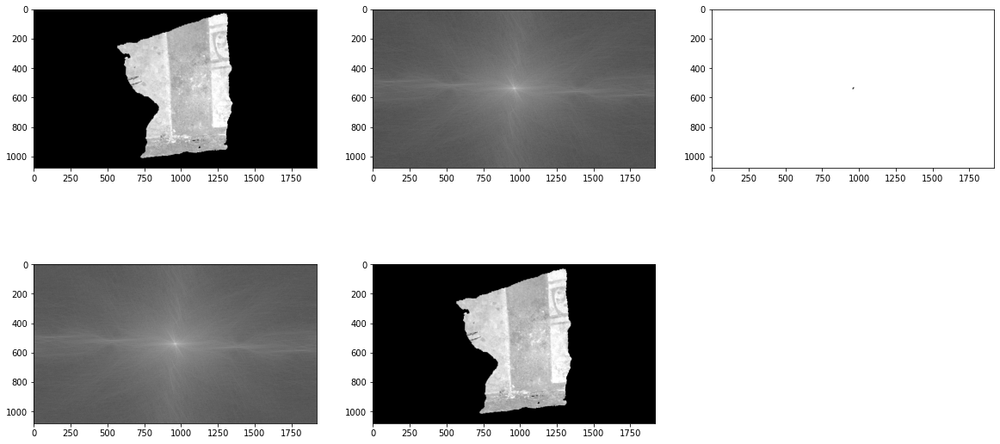

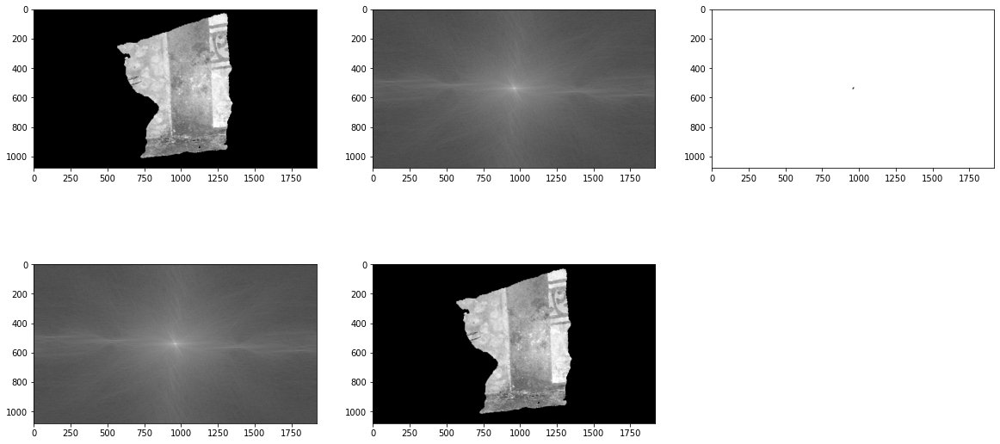

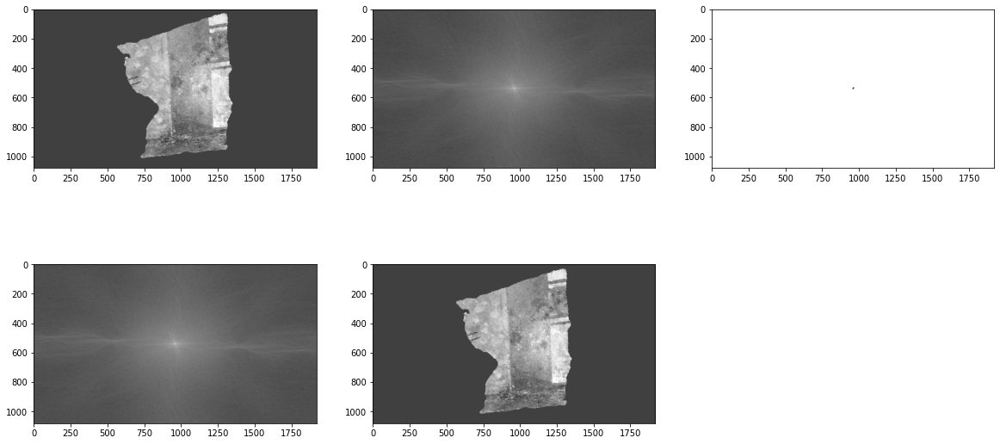

In [382]:
shift_col = 2
shift_row = 3
height_ = 6 # 300
width_ = 8 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

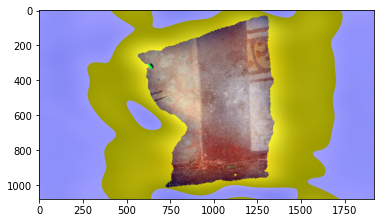

In [383]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
962
970
958
966
962
970
958
966
962
970
958
966


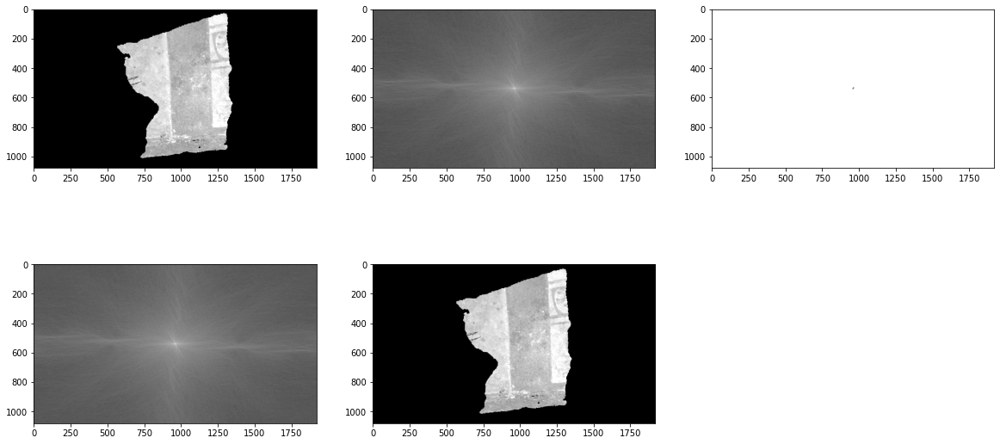

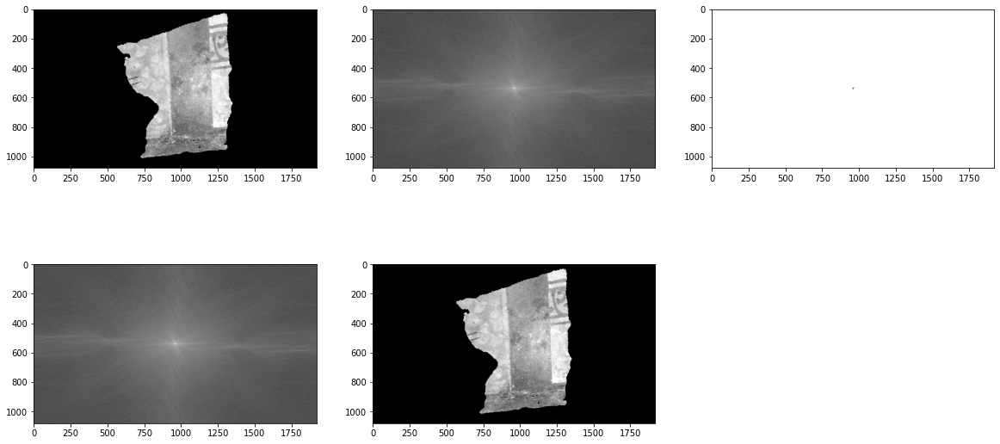

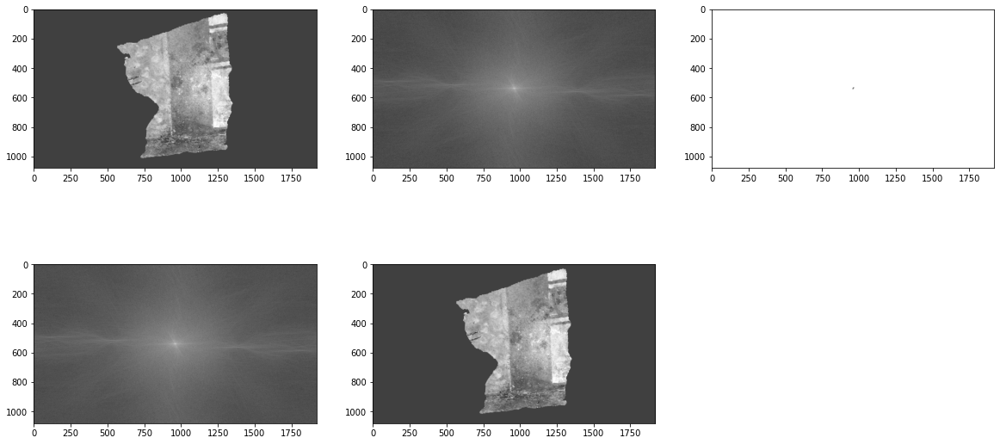

In [384]:
shift_col = 2
shift_row = 3
height_ = 4 # 300
width_ = 8 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

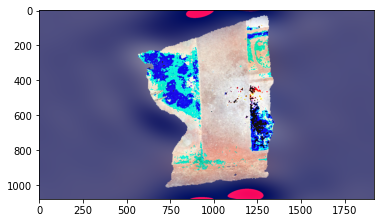

In [385]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
962
966
958
962
962
966
958
962
962
966
958
962


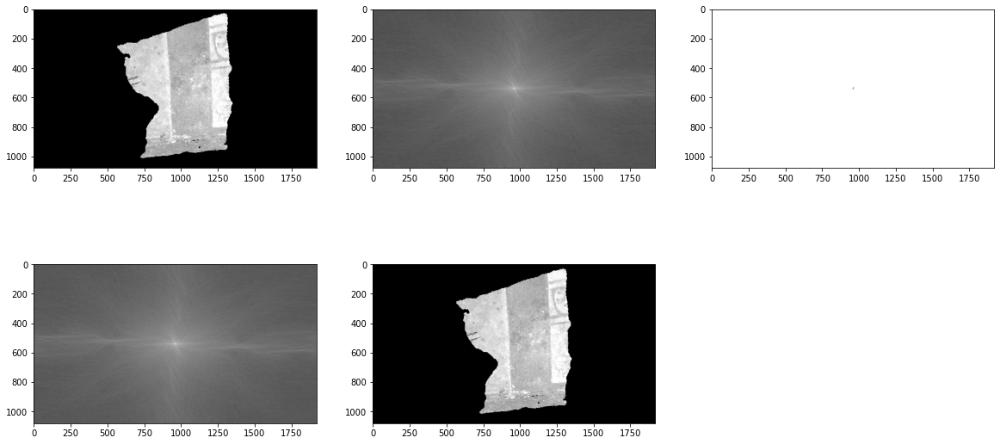

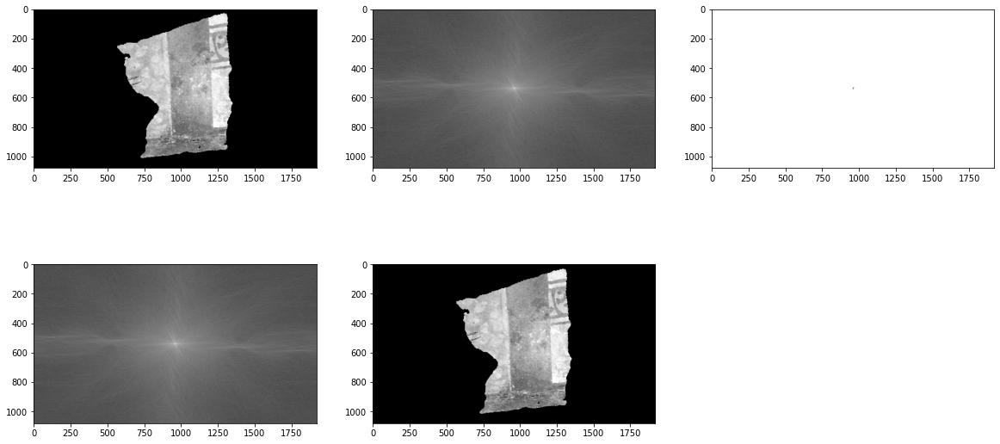

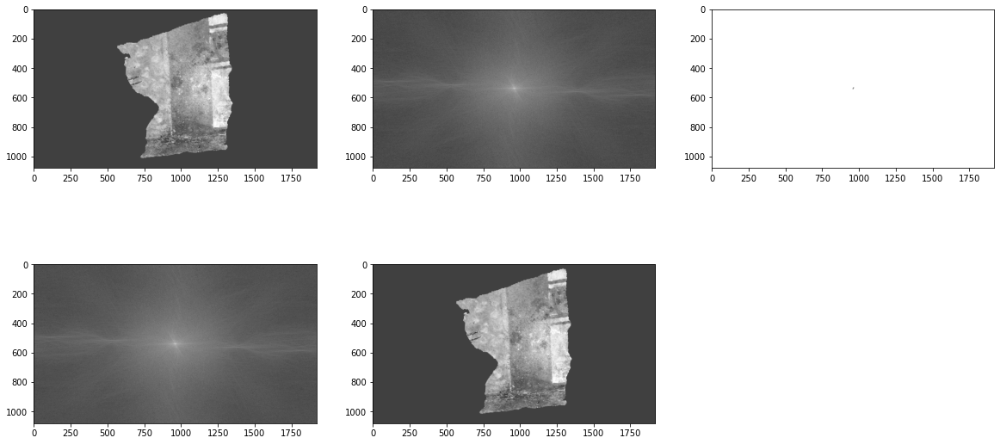

In [400]:
shift_col = 2
shift_row = 3
height_ = 6 # 300
width_ = 4 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

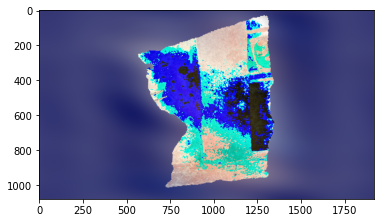

In [401]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
961
965
959
963
961
965
959
963
961
965
959
963


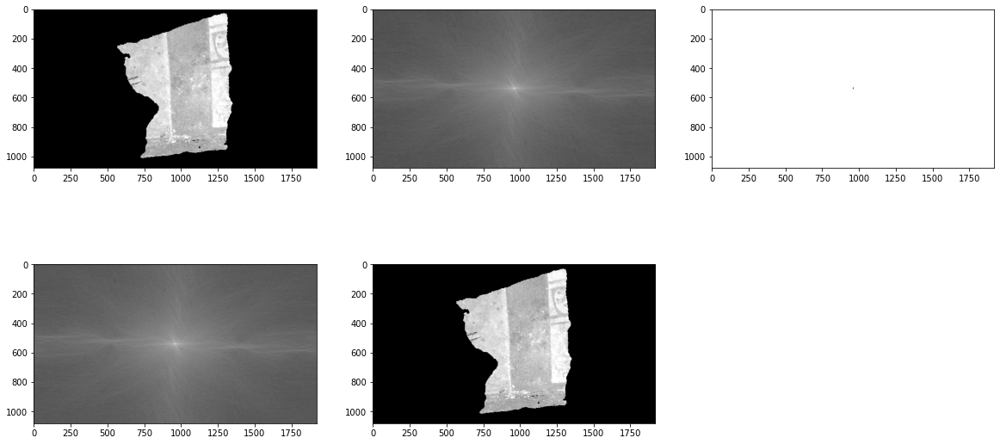

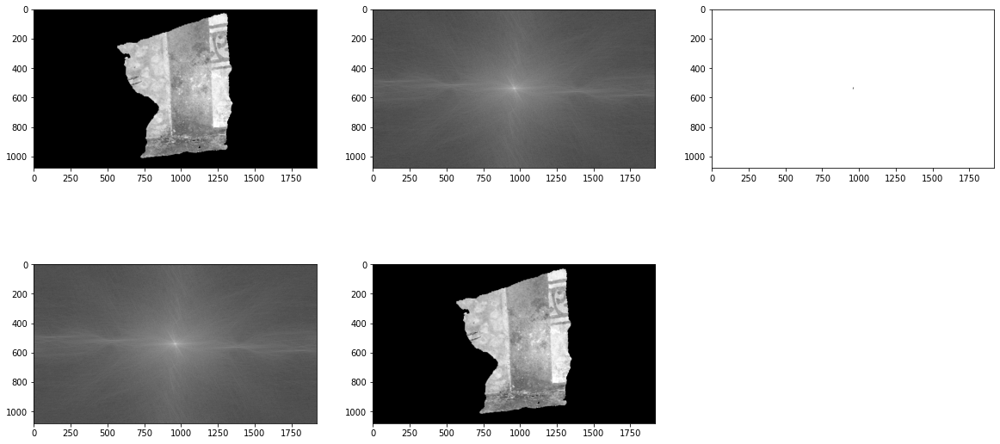

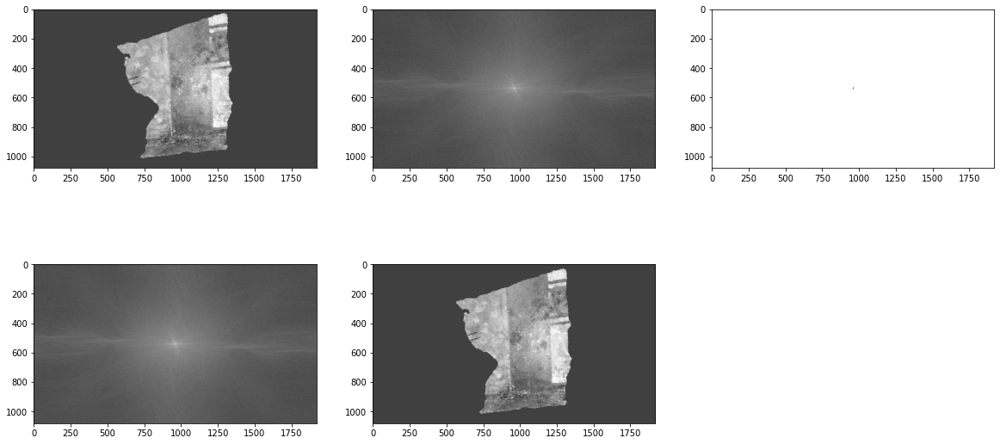

In [414]:
shift_col = 1
shift_row = 3
height_ = 6 # 300
width_ = 4 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

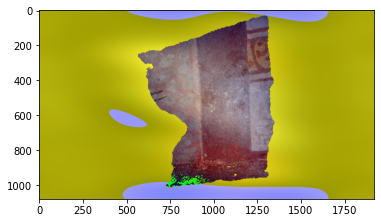

In [415]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
964
972
956
964
964
972
956
964
964
972
956
964


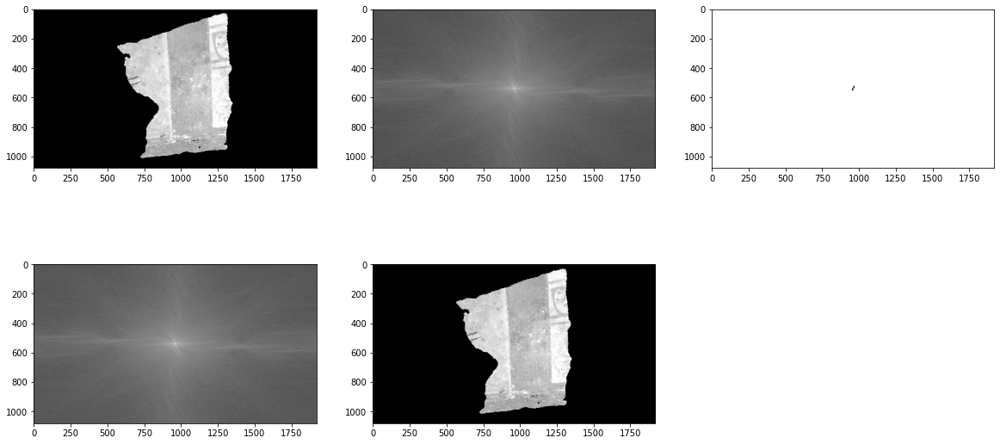

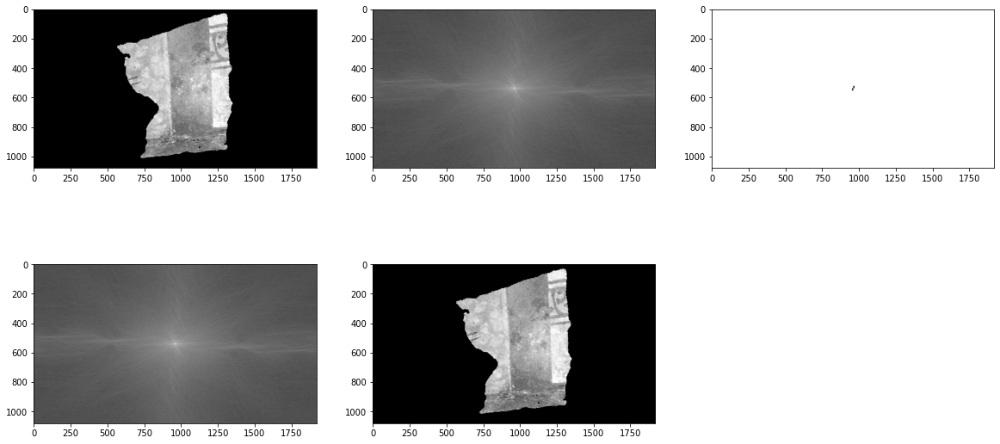

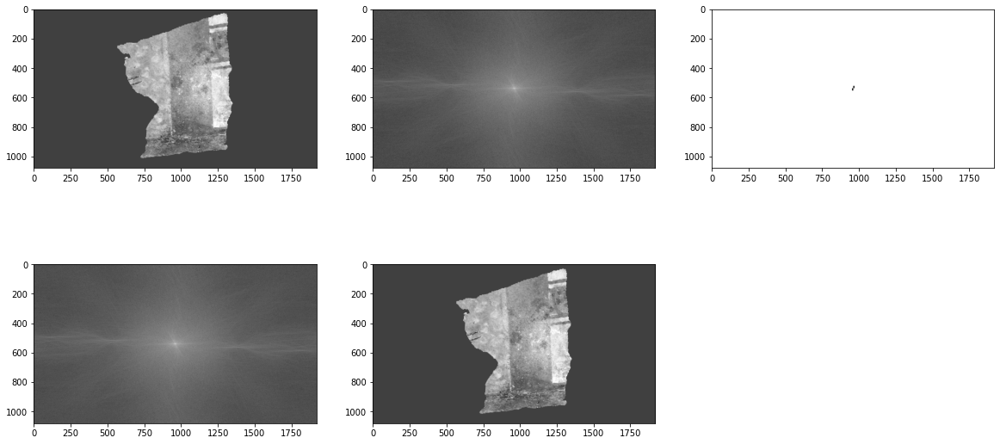

In [482]:
shift_col =4
shift_row = 8
height_ = 16 # 300
width_ = 8 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g,b]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

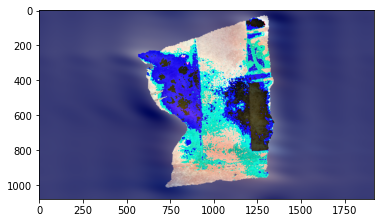

In [483]:
plt.imshow((fourier_img*255).astype(np.uint8))

300
964
972
964
972
956
964
964
972
956
964


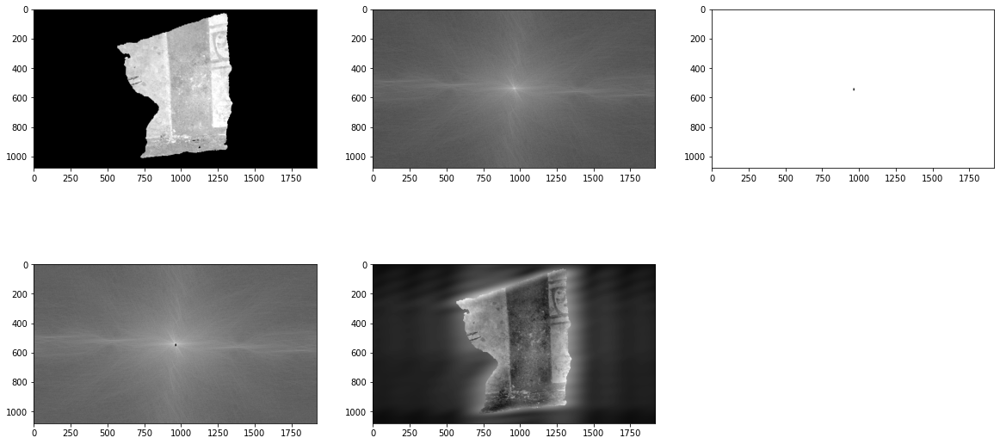

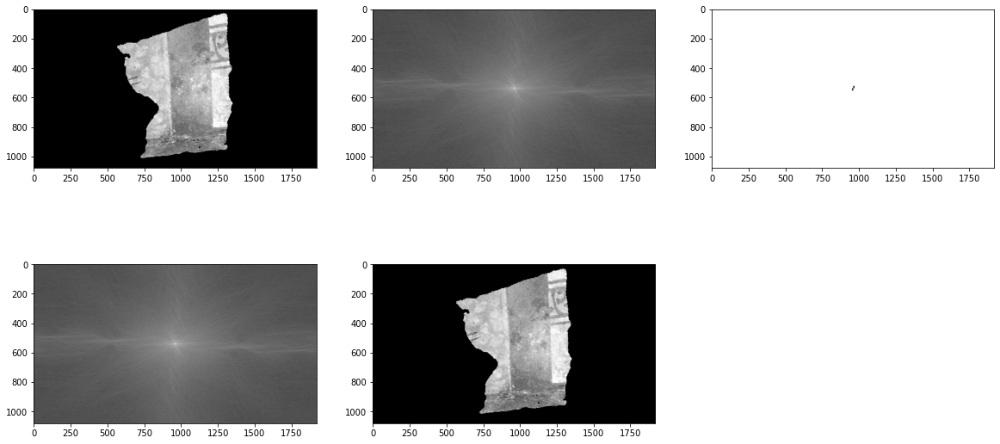

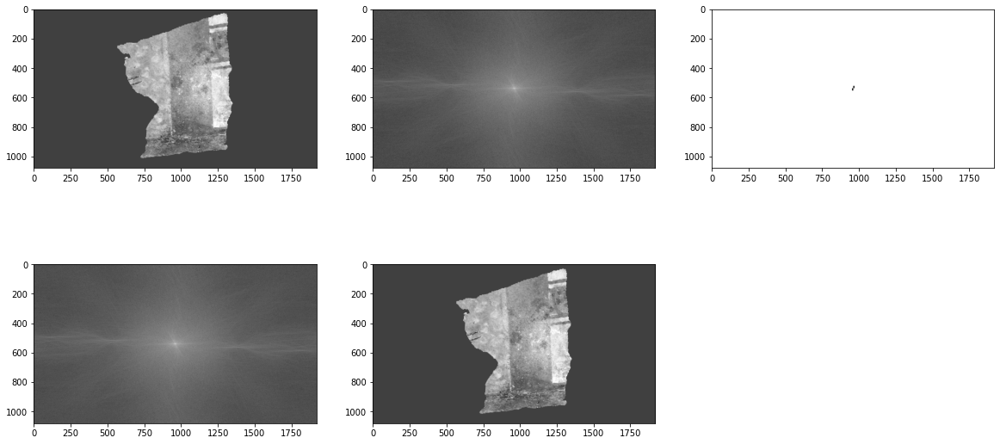

In [502]:
shift_col =4
shift_row = 8
height_ = 16 # 300
width_ = 8 # 400
print(shift_)
fourier_img = mask_fourier([r,g,b],[build_rectangle_mask(16,8,r,crow+shift_row,ccol+shift_col)]+
                           [np.bitwise_not(
                               np.bitwise_xor(
                                   build_rectangle_mask(height_,width_,ch,crow-shift_row,ccol+shift_col),
                                   build_rectangle_mask(height_,width_,ch,crow+shift_row,ccol-shift_col)))
                            for ch in [r,g]])

# fourier_img = mask_fourier([r,g,b],
                           
#                                    [build_rectangle_mask(200,20,ch,crow,ccol+200)
#                             for ch in [r,g,b]])

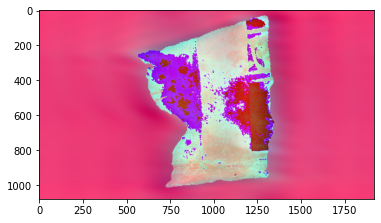

In [503]:
plt.imshow((fourier_img*255).astype(np.uint8))

# Experiment RPf_00109

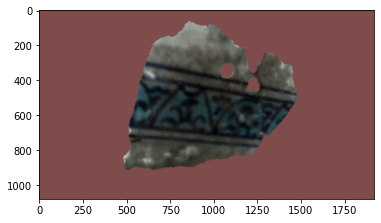

In [27]:
img_RPf_00109 = cv2.imread("RPf_00109.png")
plt.imshow(img_RPf_00109)

In [28]:
img_RPf_00109_rgb = cv2.cvtColor(img_RPf_00109,cv2.COLOR_BGR2RGB)
img_RPf_00109_gray = cv2.cvtColor(img_RPf_00109,cv2.COLOR_RGB2GRAY)

In [25]:
smoothed_img = mean_smooth_rgb(img_RPf_00109_rgb,(40,40)) # maybe bilateral will be good here
kmeans_img = segment_kmeans(smoothed_img,6)

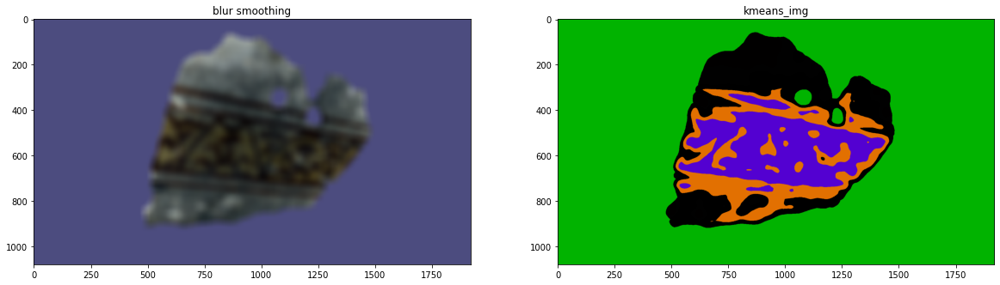

In [26]:
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["blur smoothing","kmeans_img"],1,2)

### second smoothing test

In [29]:
smoothed_img = cv2.bilateralFilter(img_RPf_00109_rgb,15,80,80) #cv2.bilateralFilter(img_RPf_00109_rgb,9,75,75) #mean_smooth_rgb(img_RPf_00109_rgb,(40,40)) # maybe bilateral will be good here
kmeans_img = segment_kmeans(smoothed_img,6)

In [30]:
kmeans_int = (kmeans_img*255).astype(np.uint8)

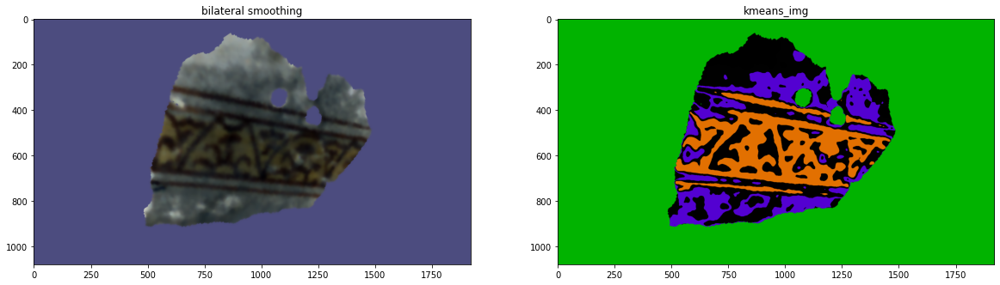

In [31]:
plot_images([smoothed_img,kmeans_int],["bilateral smoothing","kmeans_img"],1,2)

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


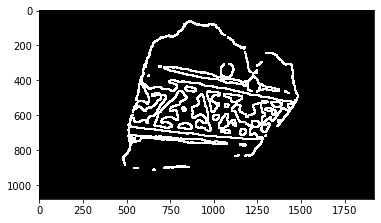

In [32]:
img_RPf_00109_gray = cv2.cvtColor((kmeans_img*255).astype(np.uint8),cv2.COLOR_RGB2GRAY)
RPf_00109_gray_edge_map = cv2.Canny(img_RPf_00109_gray,250,350)
plt.imshow(1/(1+np.abs(RPf_00109_gray_edge_map)),cmap="gray")

In [34]:
img_RPf_00109_kmeans_hsv = cv2.cvtColor(kmeans_int,cv2.COLOR_RGB2HSV)

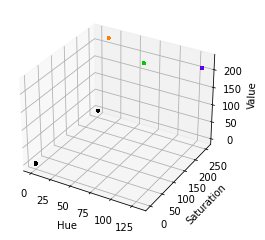

In [44]:
plotHSV(img_RPf_00109_kmeans_hsv,get_pixel_colors(kmeans_int))

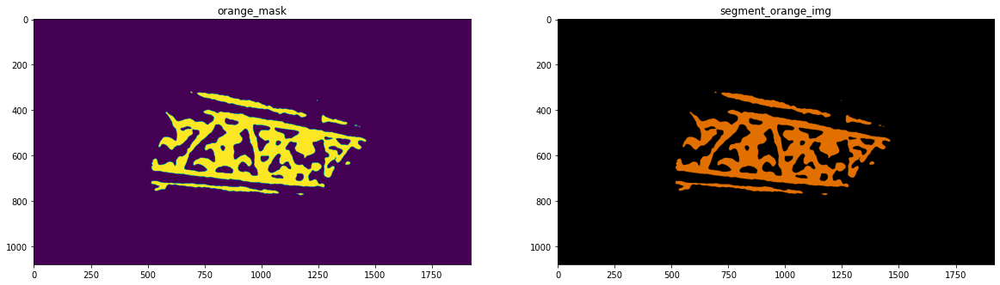

In [35]:
light_orange = (1, 190, 200)
dark_orange = (18, 255, 255)
orange_mask = cv2.inRange(img_RPf_00109_kmeans_hsv,light_orange,dark_orange)
segment_orange_img = cv2.bitwise_and(kmeans_int,kmeans_int,mask=orange_mask)
plot_images([orange_mask,segment_orange_img],["orange_mask","segment_orange_img"],1,2)

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


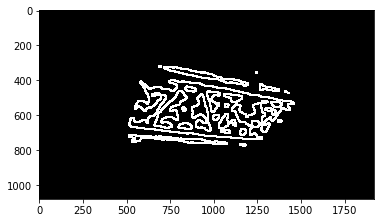

In [36]:
img_RPf_00109_segment_orange_img_gray = cv2.cvtColor((segment_orange_img*255).astype(np.uint8),cv2.COLOR_RGB2GRAY)
RPf_00109_gray_edge_map = cv2.Canny(img_RPf_00109_segment_orange_img_gray,250,350)
plt.imshow(1/(1+np.abs(RPf_00109_gray_edge_map)),cmap="gray")

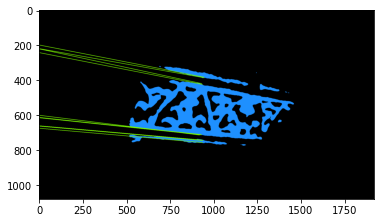

In [37]:
img_with_lines, out_lines = draw_hough_lines(
        (segment_orange_img*255).astype(np.uint8),
        RPf_00109_gray_edge_map, #1/(1+np.abs(RPf_00109_gray_edge_map))
        1*np.pi/180,min_votes=90,
        lines_color=(124,252,0))
plt.imshow(img_with_lines)

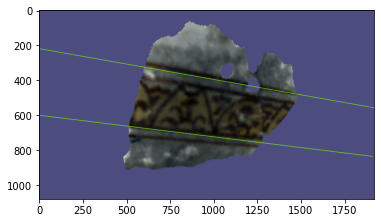

In [38]:
parrallel_lines = find_parallel_lines(out_lines)

img_RPf_00109_rgb_with_lines = np.copy(img_RPf_00109_rgb)
lines_color=(124,252,0)
for parralel_pair in parrallel_lines:
    for ln_i in range(2):
        line_ = out_lines[parralel_pair[ln_i]]
        (x11,y11),(x12,y12) = r_theta_to_points(line_[0],line_[1],point_distance=2000)
        cv2.line(img_RPf_00109_rgb_with_lines,(x11,y11),(x12,y12),lines_color,2)
    #second_line = parralel_pair[1]
plt.imshow(img_RPf_00109_rgb_with_lines)

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


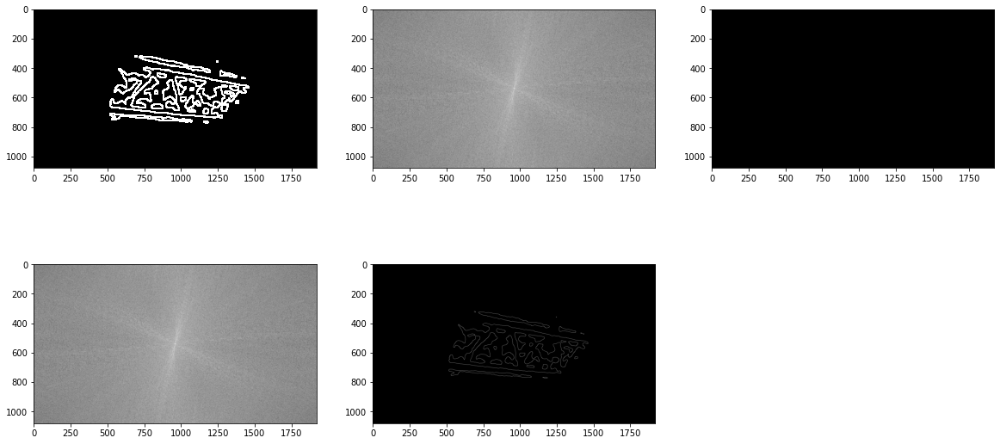

In [39]:
mask = np.ones_like(RPf_00109_gray_edge_map)
filtered_channel,amplitude,amplitude_filtered = fourier_trans(RPf_00109_gray_edge_map,mask)
plot_fourier(1/(1+np.abs(RPf_00109_gray_edge_map)),amplitude,mask,amplitude_filtered,filtered_channel)

# Simple arrow test

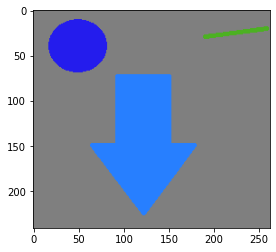

In [7]:
img_simple_example = cv2.imread("simple_example.png")
plt.imshow(img_simple_example)

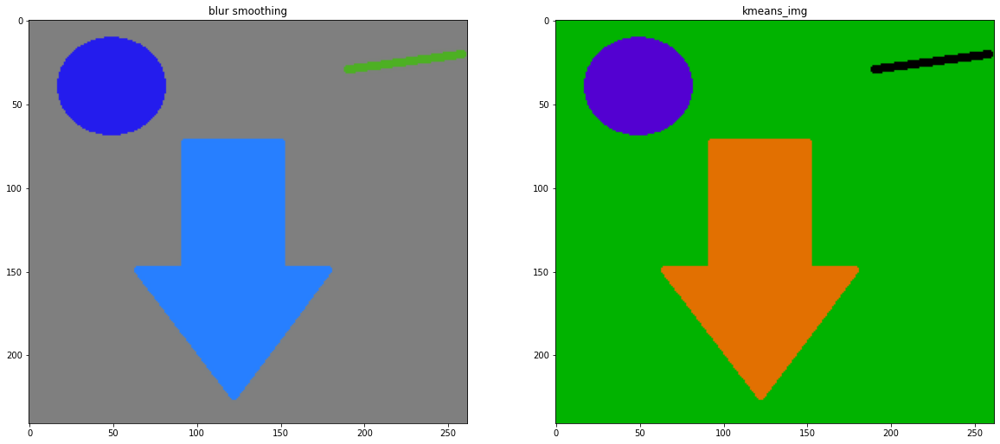

In [8]:
smoothed_img = cv2.bilateralFilter(img_simple_example,9,75,75)
kmeans_img = segment_kmeans(smoothed_img,4)
plot_images([smoothed_img,(kmeans_img*255).astype(np.uint8)],["blur smoothing","kmeans_img"],1,2)

In [9]:
img_hsv = cv2.cvtColor(img_simple_example,cv2.COLOR_BGR2HSV)
#img_rgb = cv2.cvtColor(img_simple_example,cv2.COLOR_BGR2RGB)

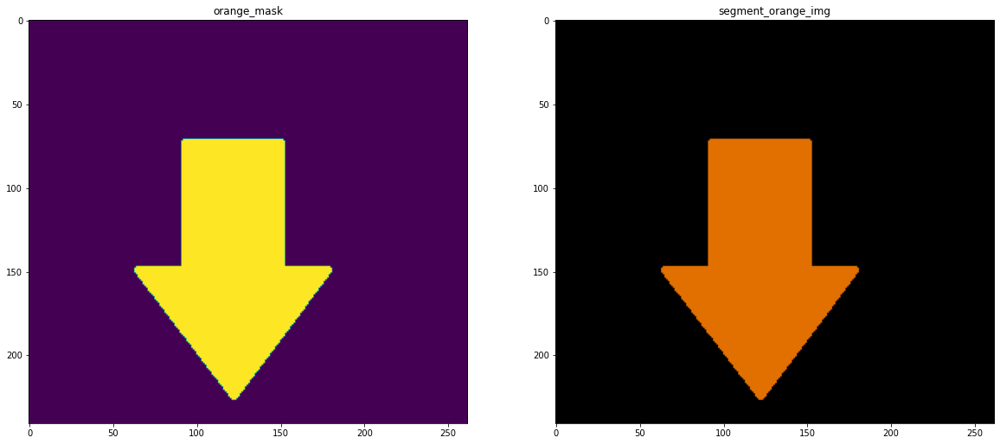

In [10]:
orange_mask,segment_orange_img = pick_color_segment(img_hsv,(kmeans_img*255).astype(np.uint8))
plot_images([orange_mask,segment_orange_img],["orange_mask","segment_orange_img"],1,2)

C:\Users\yaniv\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


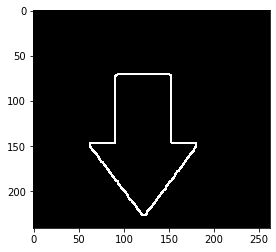

In [11]:
img_simple_example_segment_orange_gray = cv2.cvtColor((segment_orange_img*255).astype(np.uint8),cv2.COLOR_RGB2GRAY)
simple_example_gray_edge_map = cv2.Canny(img_simple_example_segment_orange_gray,250,350)
plt.imshow(1/(1+np.abs(simple_example_gray_edge_map)),cmap="gray")

[[[ 4.0000000e+01  2.4958208e+00]]

 [[ 1.5200000e+02  0.0000000e+00]]

 [[ 9.0000000e+01  0.0000000e+00]]

 [[ 4.4000000e+01  2.4783676e+00]]

 [[ 2.3500000e+02  6.4577180e-01]]

 [[ 9.2000000e+01  1.7453292e-02]]

 [[-1.5000000e+02  3.1241393e+00]]

 [[ 1.5400000e+02  1.7453292e-02]]

 [[-8.8000000e+01  3.1241393e+00]]

 [[ 7.0000000e+01  1.5707964e+00]]

 [[ 2.3300000e+02  6.2831855e-01]]

 [[ 2.3600000e+02  6.6322511e-01]]

 [[ 1.4600000e+02  1.5707964e+00]]

 [[ 6.8000000e+01  1.5882496e+00]]

 [[ 7.2000000e+01  1.5533431e+00]]

 [[ 3.7000000e+01  2.5132742e+00]]

 [[ 4.7000000e+01  2.4609141e+00]]

 [[ 2.3700000e+02  6.8067843e-01]]

 [[ 9.3000000e+01  3.4906585e-02]]

 [[-1.4800000e+02  3.1066861e+00]]

 [[ 3.2000000e+01  2.5307274e+00]]

 [[ 1.5600000e+02  3.4906585e-02]]

 [[ 7.4000000e+01  1.5358897e+00]]

 [[-8.6000000e+01  3.1066861e+00]]]
1 lines were found 


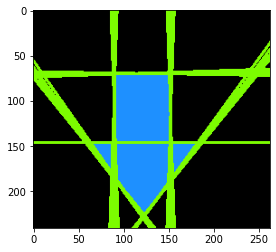

In [22]:
plt.imshow(
    draw_hough_lines(
        (segment_orange_img*255).astype(np.uint8),
        simple_example_gray_edge_map, #1/(1+np.abs(RPf_00109_gray_edge_map))
        1*np.pi/180,min_votes=30,
        lines_color=(124,252,0)))